In [488]:
import pandas as pd
from sklearn.impute import KNNImputer
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.manifold import TSNE
import random
from sklearn.cluster import KMeans
from sklearn.cluster import DBSCAN

from collections import Counter

## Data Preprocessing 

In [489]:
sub1 = pd.read_csv('../NIRS_csv/ConvoConnect_rawNIRS_CONV_ClipWatching_new240718/CC_all70dyads_40channels_CONV_sub1_new240718.csv')
sub2 = pd.read_csv('../NIRS_csv/ConvoConnect_rawNIRS_CONV_ClipWatching_new240718/CC_all70dyads_40channels_CONV_sub2_new240718.csv')

non_channel_columns = ['Subject', 'Time']
channel_columns = [f'ch_{i+1}' for i in range(len(sub1.columns) - len(non_channel_columns))]
sub1.columns = non_channel_columns + channel_columns
sub2.columns = non_channel_columns + channel_columns

In [490]:
rating = pd.read_csv('CC_JNeuro_all.csv')
rating = rating[rating['Dyads'].isin(unique_subjects)]
all_dyads = rating['Dyads'].unique()

#connection_rating =  = rating.sort_values(by = ['ConnectionComp_avg'])
low_connection = rating[rating['ConnectionComp_avg']<3]['Dyads'].unique()
high_connection = rating[rating['ConnectionComp_avg']>3.8]['Dyads'].unique()

low_depth = rating[rating['feltDepth_avg']<2]['Dyads'].unique()
high_depth = rating[rating['feltDepth_avg']>=3.5]['Dyads'].unique()

shallow = sorted([subject for subject in all_dyads if int(str(subject)[0]) % 2 != 0])
deep = sorted([subject for subject in all_dyads if int(str(subject)[0]) % 2 == 0])

In [494]:
channel_to_state = {ch: "" for ch in channels_df1.columns}

# Define the channel indices for each brain region
DMN_indices = [6, 7, 9, 11, 12, 13, 14, 15, 26, 36, 37, 38, 39]
FPN_indices = [1, 3, 4, 5, 8, 10, 16, 18, 23, 24, 30, 35, 40]
VAT_indices = [2, 17, 19, 20, 25, 27, 28, 29]
DAT_indices = [21, 22, 31, 32, 33, 34]

# Map each channel to its corresponding brain region if it exists in available_channels
for idx in DMN_indices:
    ch_name = f'ch_{idx}'
    if ch_name in channels_df1.columns:
        channel_to_state[ch_name] = "DMN"
for idx in FPN_indices:
    ch_name = f'ch_{idx}'
    if ch_name in channel_to_region:
        channel_to_state[ch_name] = "FPN"
for idx in VAT_indices:
    ch_name = f'ch_{idx}'
    if ch_name in channel_to_region:
        channel_to_state[ch_name] = "VAT"
for idx in DAT_indices:
    ch_name = f'ch_{idx}'
    if ch_name in channel_to_region:
        channel_to_state[ch_name] = "DAT"

# Convert the dictionary to a list in the order of available_channels
channel_to_state_list = [channel_to_state[ch] for ch in channels_df1.columns]

In [495]:
regions = {
    "L_lPFC": range(1, 7),
    "mPFC": range(7, 15),
    "R_lPFC": range(15, 21),
    "L_SPL": range(21, 24),
    "L_TPJ": range(24, 31),
    "R_SPL": range(31, 34),
    "R_TPJ": range(34, 41)
}

# Initialize mapping dictionary
channel_to_region = {ch: "" for ch in channels_df1.columns}

# Assign regions dynamically
for region, indices in regions.items():
    for idx in indices:
        ch_name = f'ch_{idx}'
        if ch_name in channel_to_region:
            channel_to_region[ch_name] += f", {region}" if channel_to_region[ch_name] else region

# Convert to list in the order of available channels
channel_to_region_list = [channel_to_region[ch] for ch in channels_df1.columns]

In [496]:
def upper_triangular_vector_with_diag(matrix):
    triu_indices = np.triu_indices(matrix.shape[0], k=0)
    return matrix[triu_indices]

## Intrasubject RDMs 

In [485]:
def channel_channel_matrix(dyad_list, condition = 'Across Subjects'):
    correlation_matrices = []
    
    for dyad in dyad_list:
        s1 = sub1[sub1['Subject'] == dyad]
        s2 = sub2[sub2['Subject'] == dyad]

        channels_df1 = s1.filter(regex='^ch_')
        channels_df2 = s2.filter(regex='^ch_')

        correlation_matrix1 = channels_df1.corr(method='pearson')
        correlation_matrix2 = channels_df2.corr(method='pearson')
        correlation_matrices.append(correlation_matrix1)
        correlation_matrices.append(correlation_matrix2)

    correlation_matrices = np.array(correlation_matrices)
    average_correlation_matrix = np.nanmean(correlation_matrices, axis=0)

    plt.figure(figsize=(12, 10))
    sns.heatmap(average_correlation_matrix, annot=False, cmap='viridis', square=True,
            linewidths=0.5, cbar_kws={"shrink": 0.75}, vmin=0, vmax=1)

    plt.title('Average Channel x Channel Correlation Matrix ('+str(condition)+')')
    plt.xlabel('Channels')
    plt.ylabel('Channels')
    plt.savefig('plots/avg_channel_matrix_'+str(condition)+'.png')
    plt.show()
    
    linked = linkage(average_correlation_matrix, method='ward')  

    # Plot the dendrogram
    plt.figure(figsize=(20, 5))
    dendrogram(linked, labels=channel_to_region_list)
    plt.title('Hierarchical Clustering Dendrogram')
    plt.xlabel('Sample index', fontsize=14) 
    plt.xticks(fontsize=12)
    plt.ylabel('Distance')
    plt.savefig('plots/avg_channel_cluster_'+str(condition)+'.png')
    plt.show()

    # To get cluster labels, cut the dendrogram at a chosen number of clusters
    num_clusters = 7
    clusters_hierarchical = fcluster(linked, num_clusters, criterion='maxclust')
    print("Hierarchical Clustering Labels:", clusters_hierarchical)
    
    tsne = TSNE(n_components=2, perplexity=30, random_state=42)  # Adjust perplexity as needed
    tsne_results = tsne.fit_transform(average_correlation_matrix)

    # Create a DataFrame for plotting
    tsne_df = pd.DataFrame({
    't-SNE-1': tsne_results[:, 0],
    't-SNE-2': tsne_results[:, 1],
    'Brain Region': channel_to_region_list
    }, index=channels_df1.columns)  # Assuming channels_df1.columns are channel labels
    
    # Perform k-means clustering
    kmeans = KMeans(n_clusters=3, random_state=42)
    kmeans_labels = kmeans.fit_predict(average_correlation_matrix)

    # Add k-means labels to the DataFrame
    tsne_df['KMeans Cluster'] = kmeans_labels

    # Plot t-SNE with cluster labels
    plt.figure(figsize=(10, 8))
    sns.scatterplot(
    x='t-SNE-1', y='t-SNE-2',
    hue='Brain Region', palette='tab10', style='KMeans Cluster', # Customize palette as needed
    data=tsne_df, legend='full',s=100 
    )
    plt.title("t-SNE Visualization of Brain Regions")
    plt.xlabel("t-SNE Component 1")
    plt.ylabel("t-SNE Component 2")
    plt.legend(title="Cluster")
    plt.savefig('plots/avg_channel_tsne_cluster_'+str(condition)+'.png')
    plt.show()
    
    return average_correlation_matrix

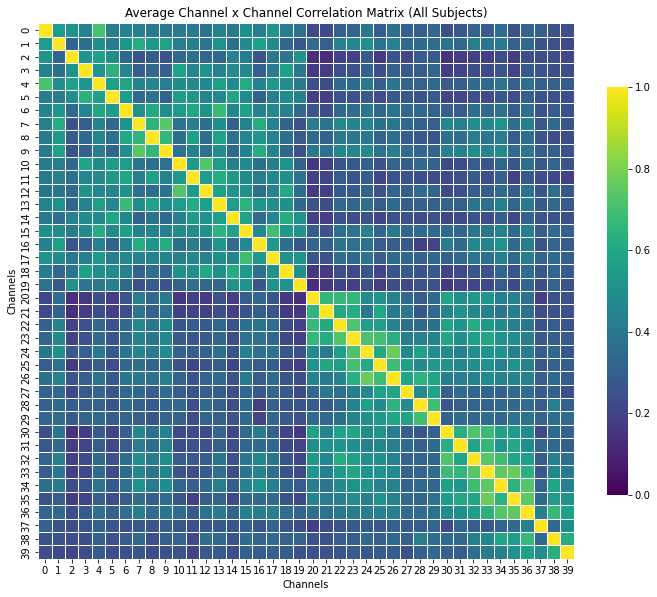

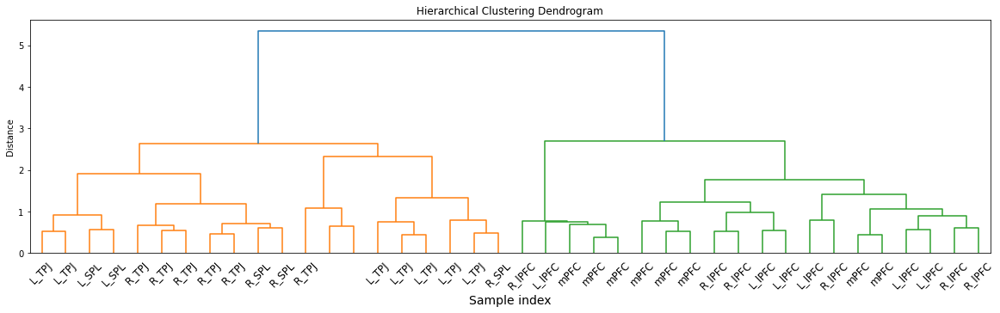

Hierarchical Clustering Labels: [6 5 7 7 6 7 6 5 5 5 7 6 7 6 7 6 5 6 7 7 1 1 1 1 4 4 4 4 4 4 2 2 2 2 2 2 2
 3 3 3]


/home/joyce/.local/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


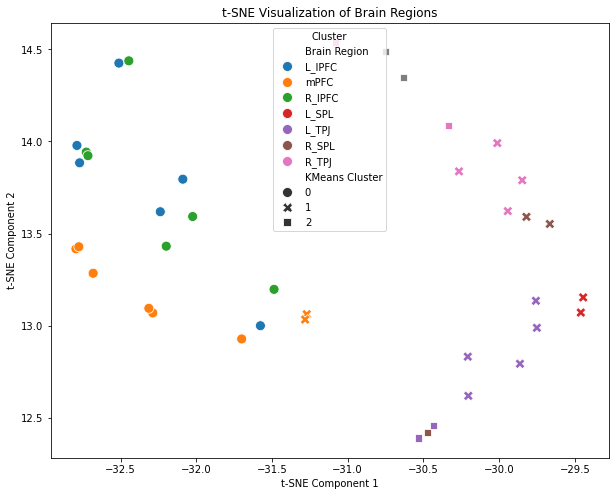

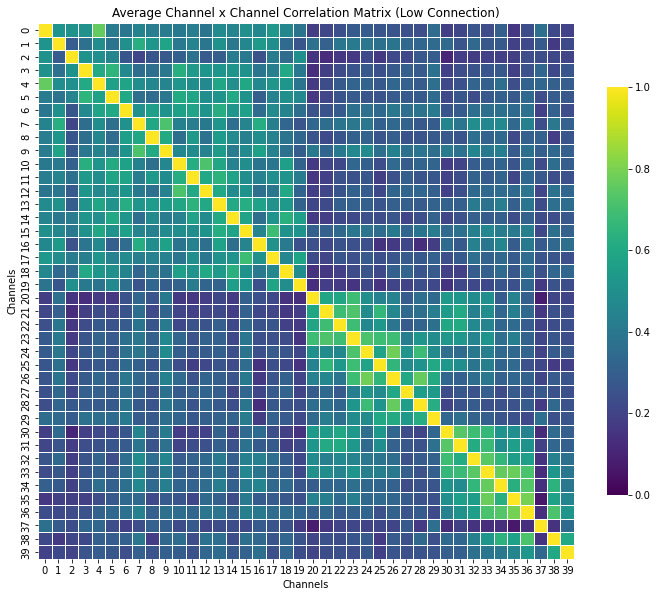

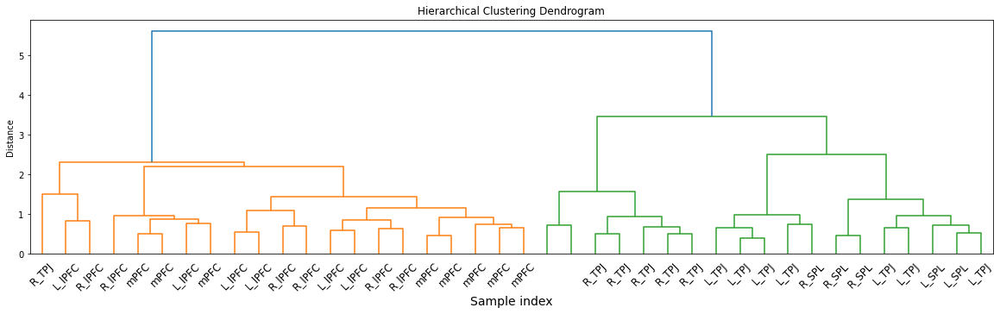

Hierarchical Clustering Labels: [3 2 1 3 3 3 3 2 2 2 3 3 3 3 3 3 2 3 3 1 7 7 7 7 6 7 6 6 6 6 7 7 5 5 5 5 5
 1 4 4]


/home/joyce/.local/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


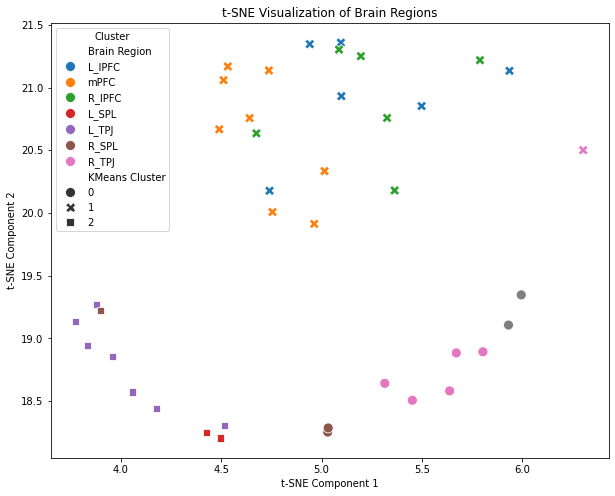

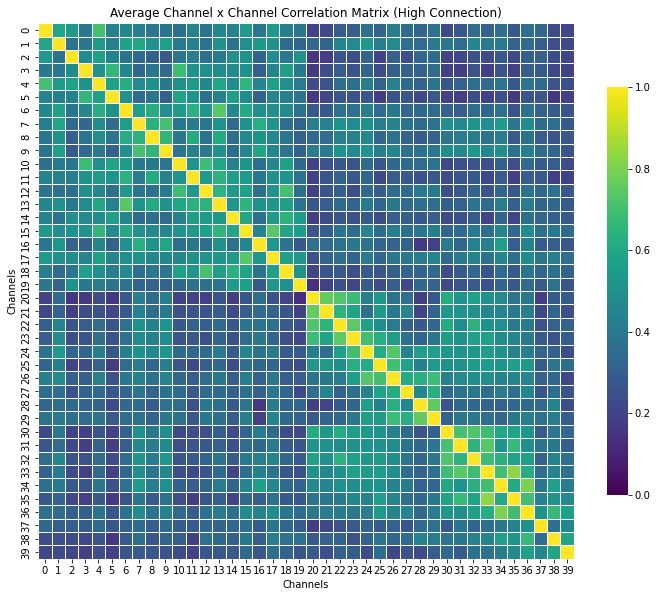

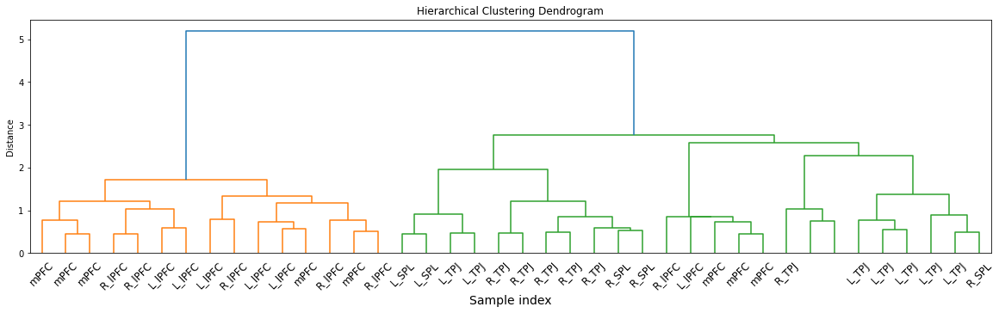

Hierarchical Clustering Labels: [1 5 2 2 1 2 1 5 5 5 2 1 2 1 2 1 5 1 2 2 3 3 3 3 7 7 7 7 7 7 4 4 4 4 4 4 4
 6 6 6]


/home/joyce/.local/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


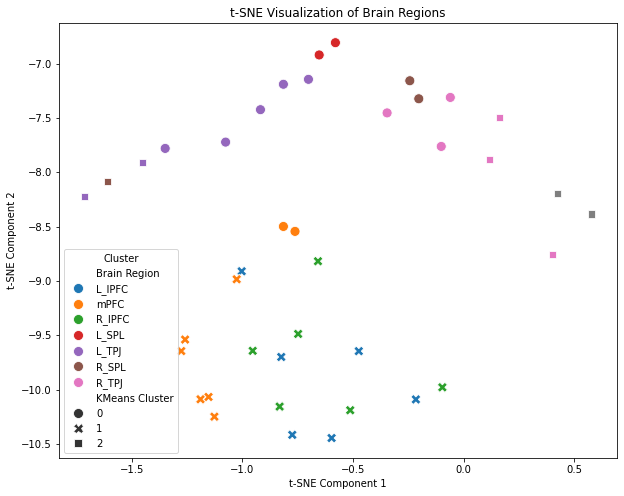

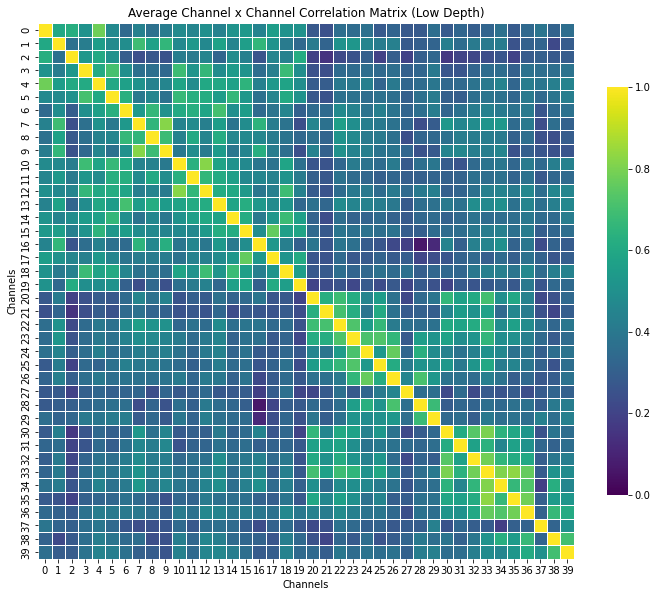

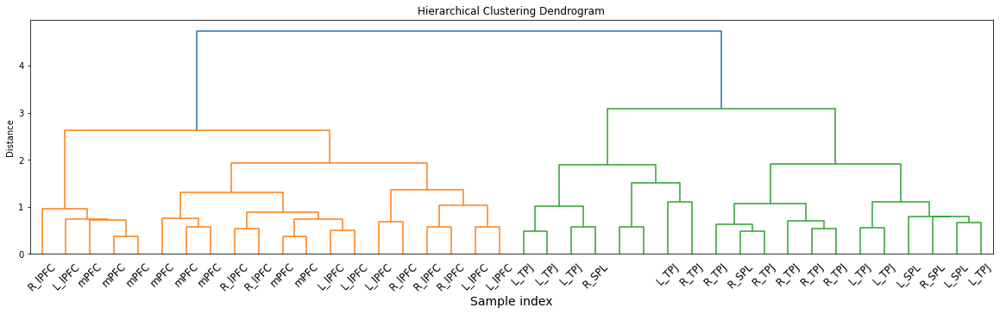

Hierarchical Clustering Labels: [3 1 3 2 3 2 2 1 1 1 2 2 2 2 2 3 1 3 2 3 7 7 7 7 4 7 4 5 4 4 6 7 6 6 6 6 6
 5 5 5]


/home/joyce/.local/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


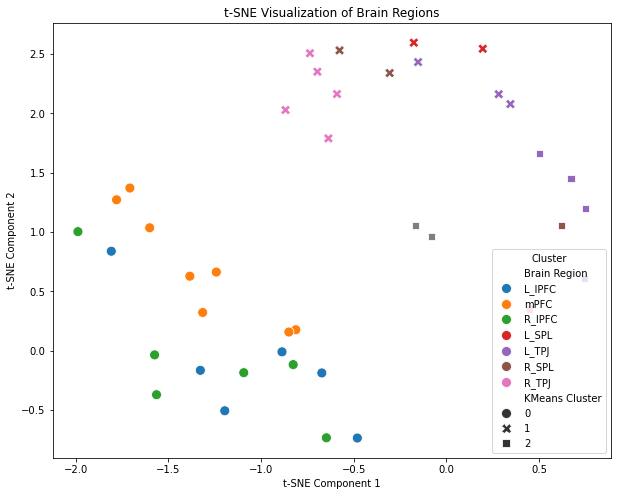

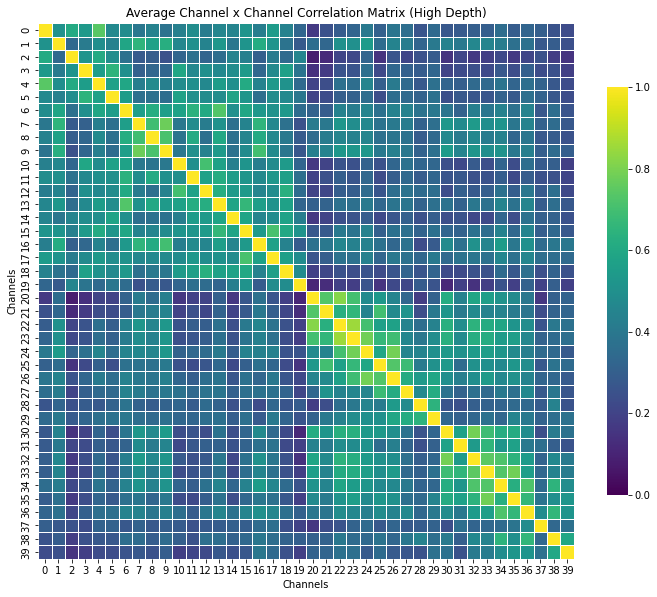

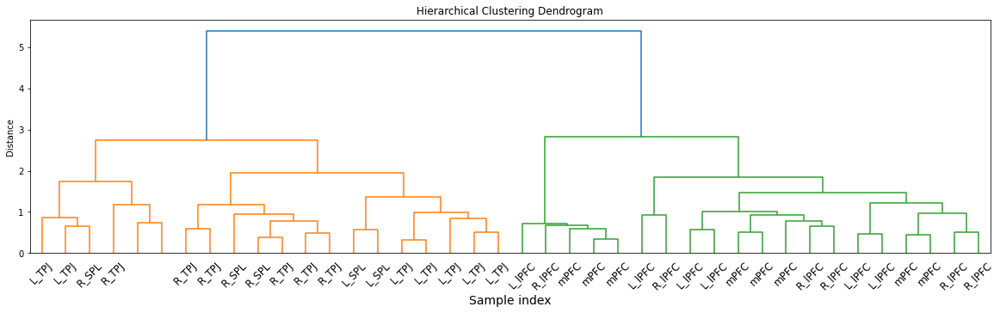

Hierarchical Clustering Labels: [7 5 6 7 7 7 7 5 5 5 7 7 7 7 7 7 5 7 7 6 4 4 4 4 4 4 4 1 1 1 3 3 3 3 3 3 3
 2 2 2]


/home/joyce/.local/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


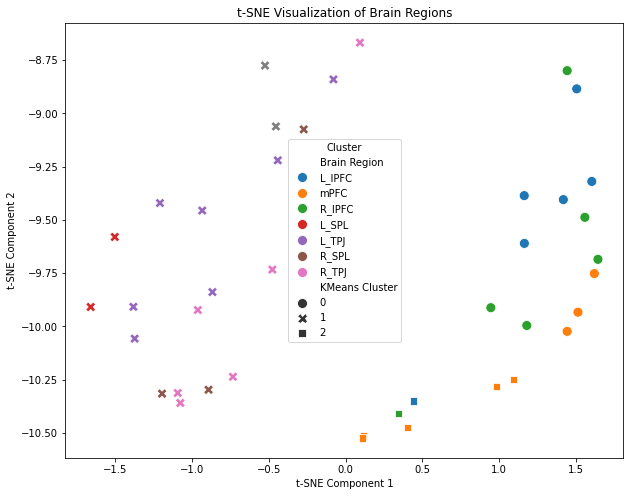

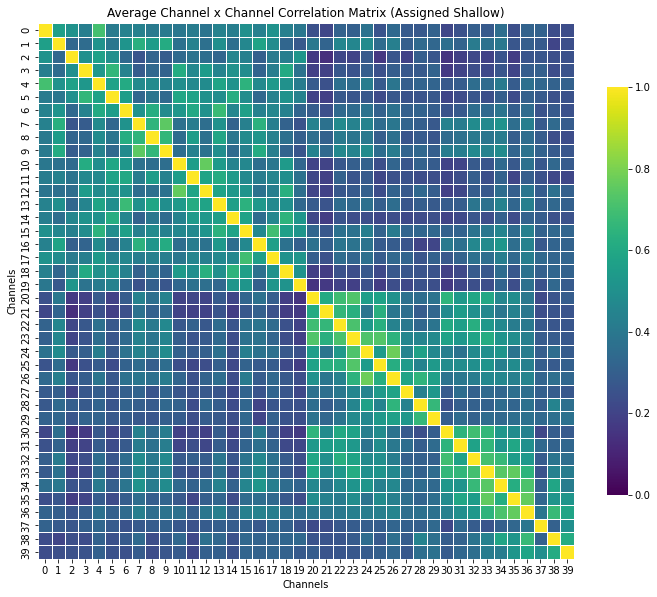

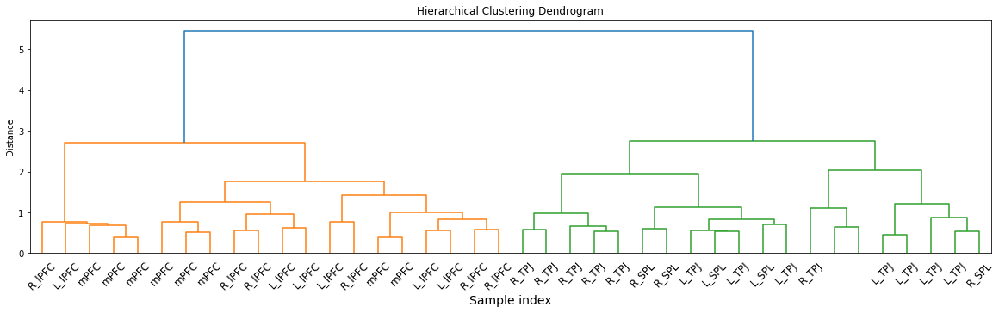

Hierarchical Clustering Labels: [2 1 3 3 2 3 2 1 1 1 3 2 3 2 3 2 1 2 3 3 5 5 5 5 7 5 7 7 7 7 5 5 4 4 4 4 4
 6 6 6]


/home/joyce/.local/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


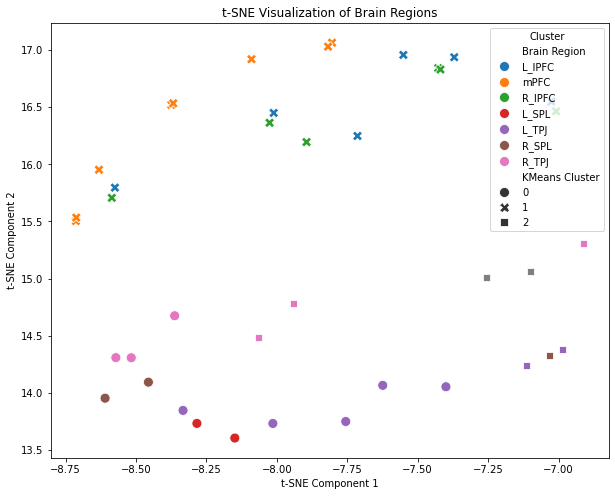

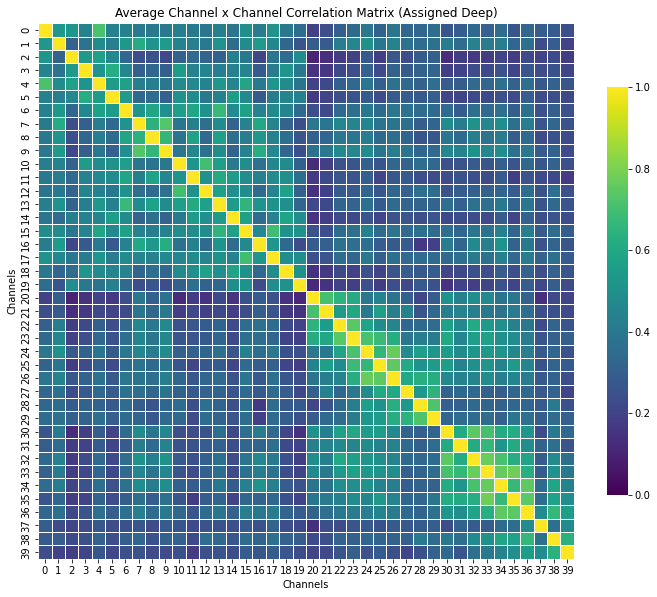

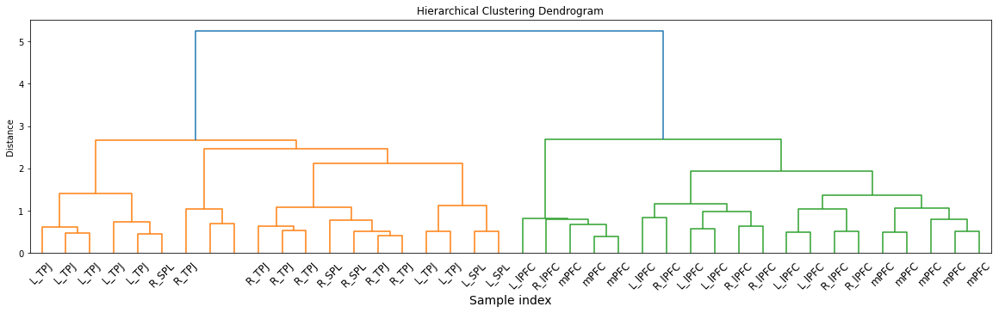

Hierarchical Clustering Labels: [7 5 6 6 7 6 7 5 5 5 7 7 7 7 6 7 5 7 6 6 4 4 4 4 1 1 1 1 1 1 3 3 3 3 3 3 3
 2 2 2]


/home/joyce/.local/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


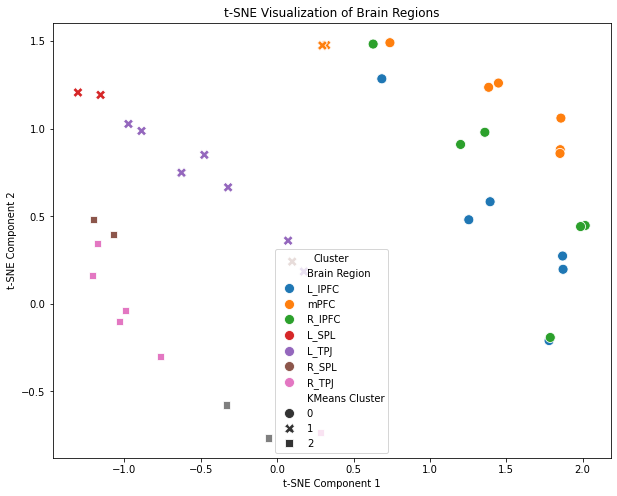

In [486]:
all_dyads_matrix = channel_channel_matrix(all_dyads, condition = 'All Subjects')

low_connection_matrix = channel_channel_matrix(low_connection, condition = 'Low Connection')
high_connection_matrix = channel_channel_matrix(high_connection, condition = 'High Connection')

low_depth_matrix = channel_channel_matrix(low_depth, condition = 'Low Depth')
high_depth_matrix = channel_channel_matrix(high_depth, condition = 'High Depth')

shallow_matrix = channel_channel_matrix(shallow, condition = 'Assigned Shallow')
deep_matrix = channel_channel_matrix(deep, condition = 'Assigned Deep')

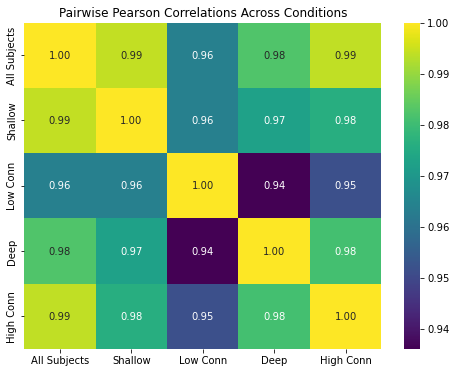

In [487]:
# List of matrices
matrices = [
    all_dyads_matrix,
    shallow_matrix,
    low_connection_matrix,
    high_connection_matrix,
    deep_matrix
#     low_depth_matrix,
#     high_depth_matrix,
    
]

# Compute upper triangular vectors including diagonal
upper_tri_vectors_with_diag = [upper_triangular_vector_with_diag(matrix) for matrix in matrices]

# Initialize a correlation matrix
num_matrices = len(upper_tri_vectors_with_diag)
correlation_matrix_diag = np.zeros((num_matrices, num_matrices))

# Compute pairwise Pearson correlations
for i in range(num_matrices):
    for j in range(num_matrices):
        corr, _ = pearsonr(upper_tri_vectors_with_diag[i], upper_tri_vectors_with_diag[j])
        correlation_matrix_diag[i, j] = corr

# Visualize the correlation matrix
plt.figure(figsize=(8, 6))
sns.heatmap(correlation_matrix_diag, annot=True, fmt=".2f", cmap='viridis',
            xticklabels=['All Subjects', 'Shallow','Low Conn','Deep', 'High Conn'],
            yticklabels=['All Subjects', 'Shallow','Low Conn', 'Deep', 'High Conn'])
plt.title('Pairwise Pearson Correlations Across Conditions')
plt.show()


## Intersubject RDMs 

In [481]:
def channel_channel_matrix(dyad_list, condition = 'Across Subjects'):
    correlation_matrices = []
    
    for dyad in dyad_list:
        s1 = sub1[sub1['Subject'] == dyad]
        s2 = sub2[sub2['Subject'] == dyad]

        channels_df1 = s1.filter(regex='^ch_')
        channels_df2 = s2.filter(regex='^ch_')

        correlation_matrix = pd.DataFrame(index=channels_df1.columns, columns=channels_df2.columns)

        for ch1 in channels_df1.columns:
            for ch2 in channels_df2.columns:
                paired_data = pd.concat([channels_df1[ch1], channels_df2[ch2]], axis=1, keys=['s1', 's2']).dropna()
            
                # Compute correlation if there is sufficient data, otherwise set to 0
                if not paired_data.empty:
                    correlation_matrix.loc[ch1, ch2] = paired_data['s1'].corr(paired_data['s2'])
                else:
                    correlation_matrix.loc[ch1, ch2] = None

        # Convert the correlation matrix to numeric type
        correlation_matrix = correlation_matrix.astype(float)
        correlation_matrices.append(correlation_matrix)
        print(dyad)
    
    correlation_matrices = np.array(correlation_matrices)
    average_correlation_matrix = np.nanmean(correlation_matrices, axis=0)

    plt.figure(figsize=(12, 10))
    sns.heatmap(average_correlation_matrix, annot=False, cmap='viridis', square=True,
            linewidths=0.5, cbar_kws={"shrink": 0.75}, vmin=-0.2, vmax=0.2)

    plt.title('Average Channel x Channel Correlation Matrix ('+str(condition)+')')
    plt.xlabel('Channels')
    plt.ylabel('Channels')
    plt.savefig('plots/dyad_channel_matrix_'+str(condition)+'.png')
    plt.show()
    
    linked = linkage(average_correlation_matrix, method='ward')  

    # Plot the dendrogram
    plt.figure(figsize=(20, 5))
    dendrogram(linked, labels=channel_to_region_list)
    plt.title('Hierarchical Clustering Dendrogram')
    plt.xlabel('Sample index', fontsize=14) 
    plt.xticks(fontsize=12)
    plt.ylabel('Distance')
    plt.savefig('plots/dyad_channel_cluster_'+str(condition)+'.png')
    plt.show()

    # To get cluster labels, cut the dendrogram at a chosen number of clusters
    num_clusters = 7
    clusters_hierarchical = fcluster(linked, num_clusters, criterion='maxclust')
    print("Hierarchical Clustering Labels:", clusters_hierarchical)
    
    tsne = TSNE(n_components=2, perplexity=30, random_state=42)  # Adjust perplexity as needed
    tsne_results = tsne.fit_transform(average_correlation_matrix)

    # Create a DataFrame for plotting
    tsne_df = pd.DataFrame({
    't-SNE-1': tsne_results[:, 0],
    't-SNE-2': tsne_results[:, 1],
    'Brain Region': channel_to_region_list
    }, index=channels_df1.columns)  # Assuming channels_df1.columns are channel labels
    
    # Perform k-means clustering
    kmeans = KMeans(n_clusters=3, random_state=42)
    kmeans_labels = kmeans.fit_predict(average_correlation_matrix)

    # Add k-means labels to the DataFrame
    tsne_df['KMeans Cluster'] = kmeans_labels
    
    # Plot t-SNE with cluster labels
    plt.figure(figsize=(10, 8))
    sns.scatterplot(
    x='t-SNE-1', y='t-SNE-2',
    hue='Brain Region', palette='tab10', style='KMeans Cluster', # Customize palette as needed
    data=tsne_df, legend='full',s=100 
    )
    plt.title("t-SNE Visualization of Brain Regions")
    plt.xlabel("t-SNE Component 1")
    plt.ylabel("t-SNE Component 2")
    plt.legend(title="Cluster")
    plt.savefig('plots/dyad_channel_tsne_cluster_'+str(condition)+'.png')
    plt.show()
    
    return average_correlation_matrix

3020
3030
3120
3130
3170
3230
4040
4050
4060
4700
4720
5110
5120
5140
5150
5160
5170
5190
5210
5310
5410
5420
5430
5440
5450
5460
5470
5480
5490
5510
5710
5720
5730
5740
5760
5770
5780
5790
5830
5840
5850
6110
6120
6130
6140
6150
6160
6170
6190
6210
6220
6410
6420
6430
6440
6450
6460
6470
6480
6490
6710
6730
6760
6770
6790
6810
6820
6830
6840
6850


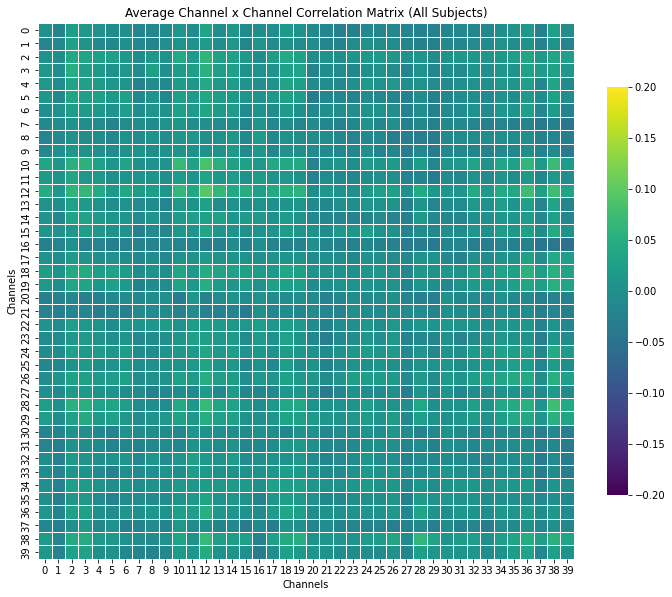

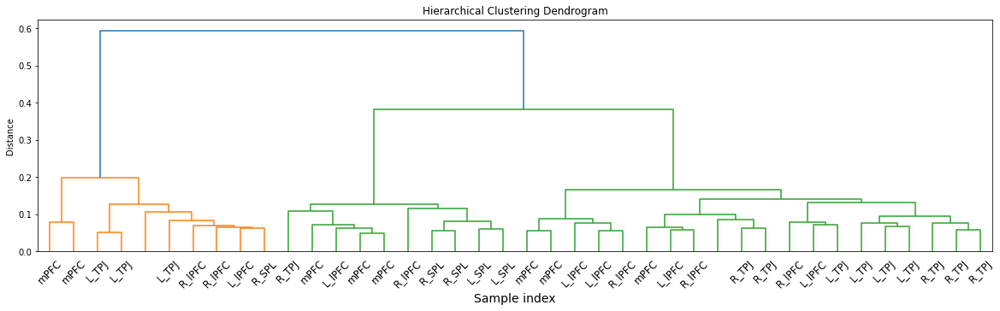

Hierarchical Clustering Labels: [6 3 2 4 5 4 4 3 3 3 1 4 1 5 4 5 3 6 2 2 3 3 7 7 2 7 2 6 2 2 3 3 7 7 5 7 5
 3 2 5]


/home/joyce/.local/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


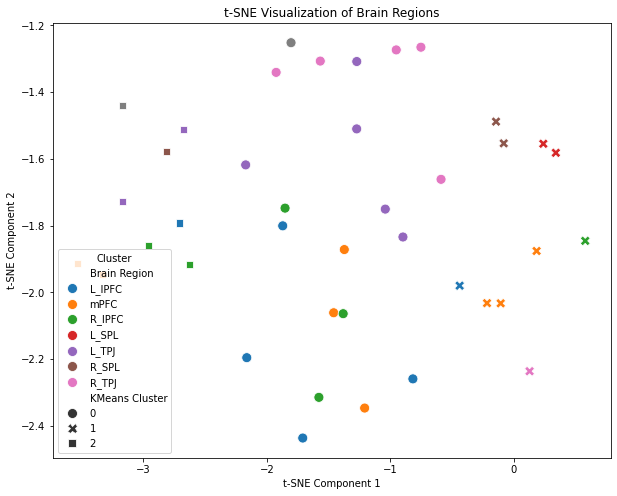

3020
3230
4720
5440
5450
5460
5730
5760
5780
6480
6830


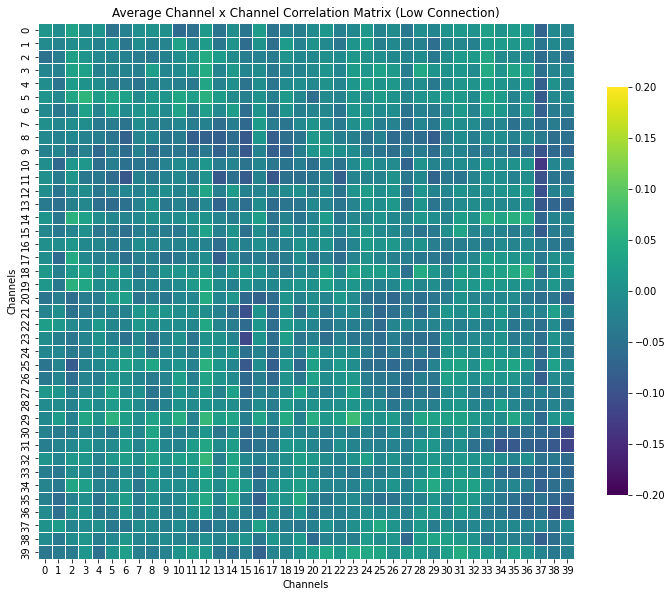

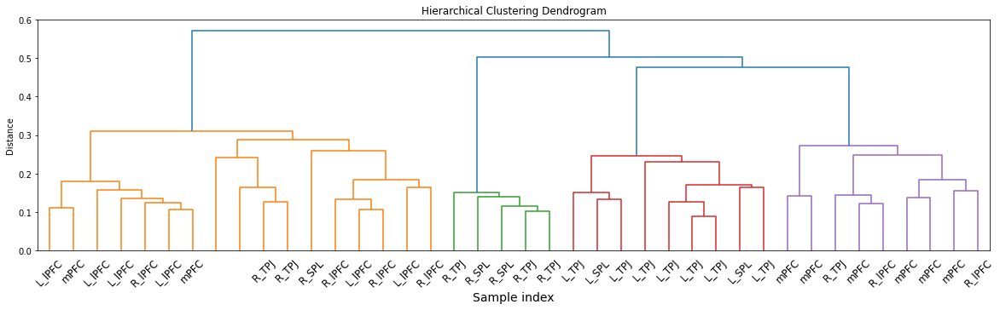

Hierarchical Clustering Labels: [1 1 1 3 1 3 1 7 6 6 7 7 1 7 3 1 7 7 3 3 5 5 5 5 5 5 5 5 5 3 4 4 2 4 2 4 4
 7 2 2]


/home/joyce/.local/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


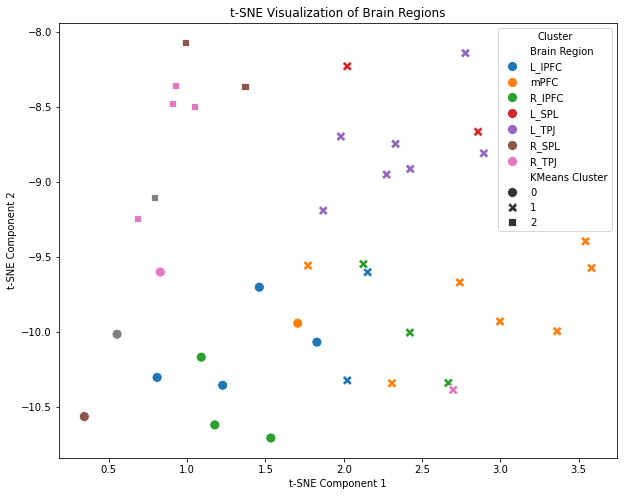

3030
3130
4060
5140
5210
5480
6160
6190
6440
6810
6820
6840


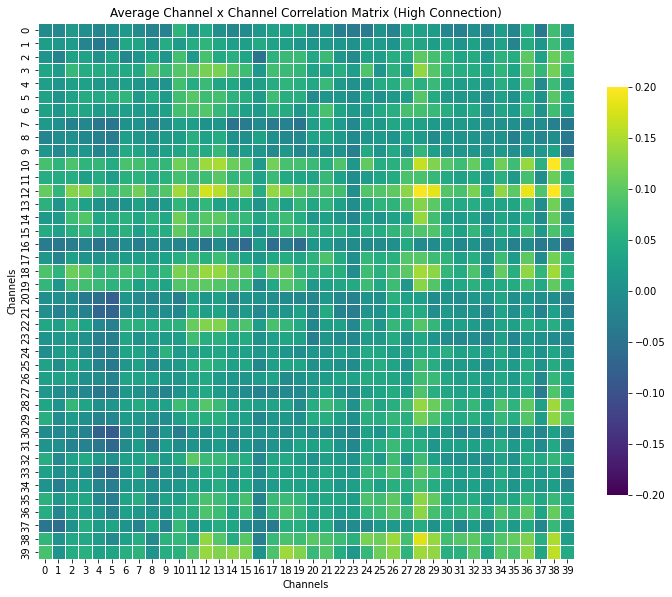

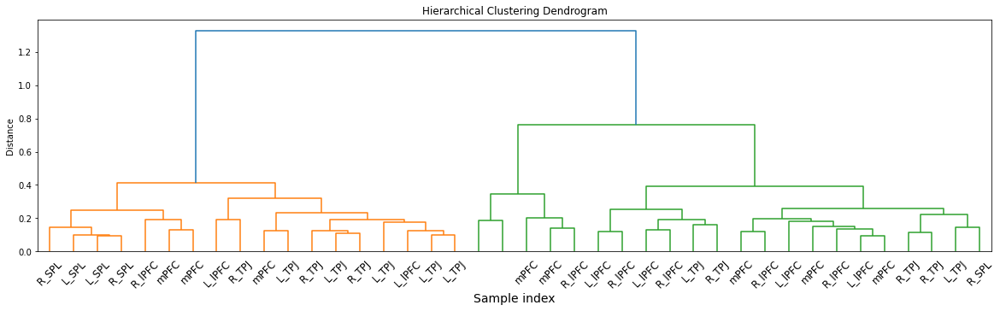

Hierarchical Clustering Labels: [2 3 7 6 7 6 7 1 1 3 5 7 5 7 6 7 1 7 5 6 1 1 6 3 3 3 3 3 7 7 1 1 6 3 3 7 7
 2 4 4]


/home/joyce/.local/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


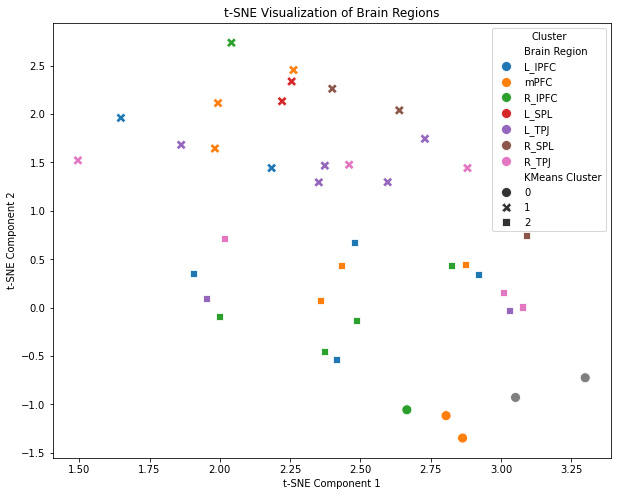

5150
5410
5430
5440
5450
5730
5780
5830
6760


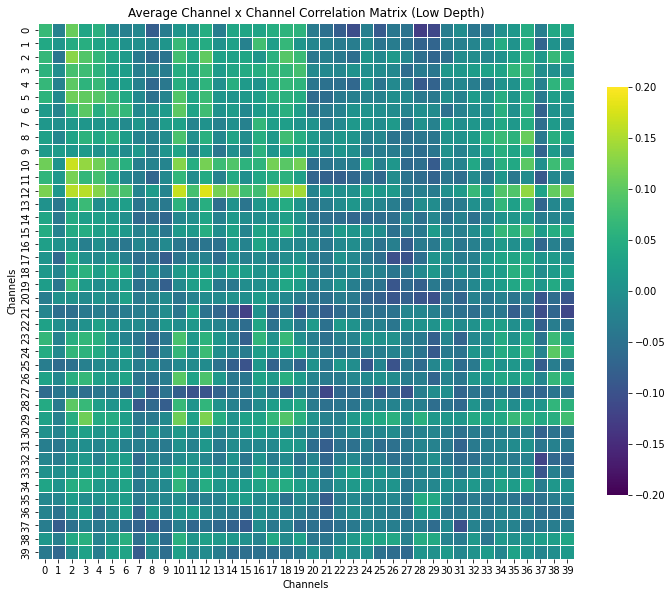

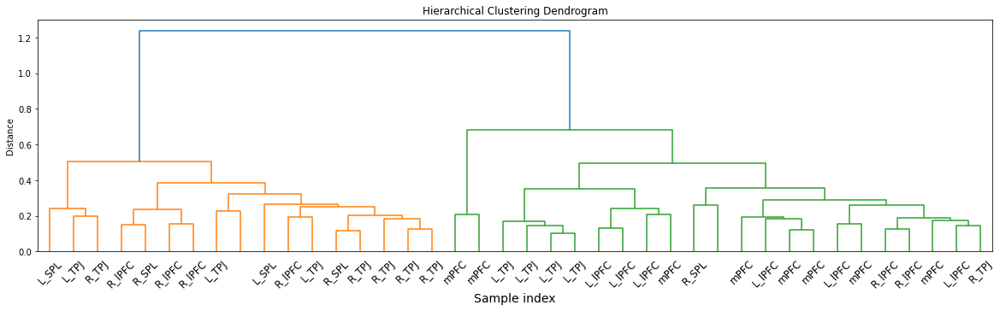

Hierarchical Clustering Labels: [5 7 5 7 5 7 7 7 7 7 4 5 4 7 2 7 3 2 7 2 3 1 3 5 5 3 5 1 5 6 3 2 3 3 7 3 3
 1 6 3]


/home/joyce/.local/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


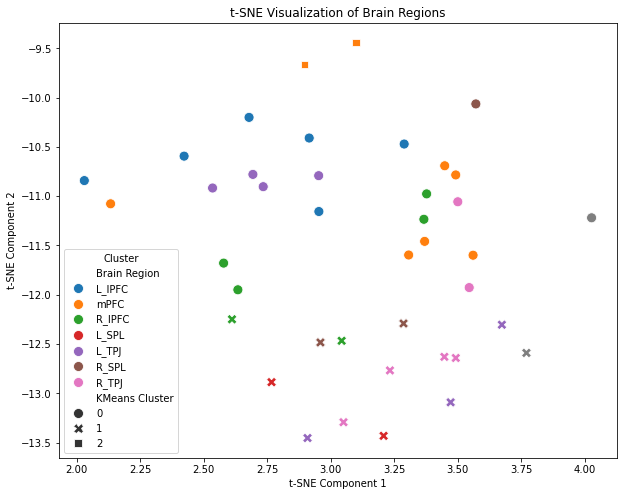

5140
5790
6110
6130
6160
6170
6190
6220
6410
6710
6730
6810
6840


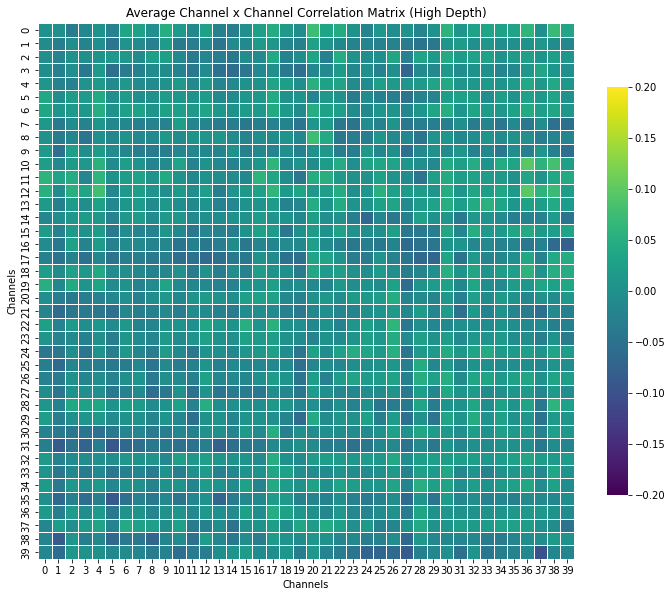

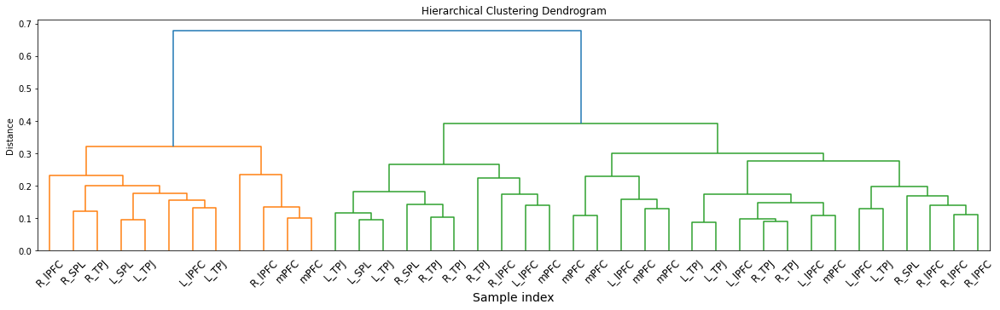

Hierarchical Clustering Labels: [5 4 6 1 6 7 5 2 4 2 5 5 5 6 4 7 2 1 7 7 3 1 3 3 6 1 6 1 7 7 3 1 6 3 6 1 3
 4 1 2]


/home/joyce/.local/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


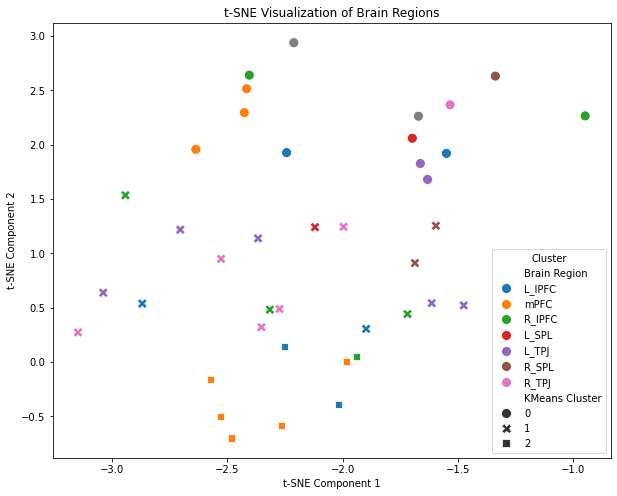

3020
3030
3120
3130
3170
3230
5110
5120
5140
5150
5160
5170
5190
5210
5310
5410
5420
5430
5440
5450
5460
5470
5480
5490
5510
5710
5720
5730
5740
5760
5770
5780
5790
5830
5840
5850


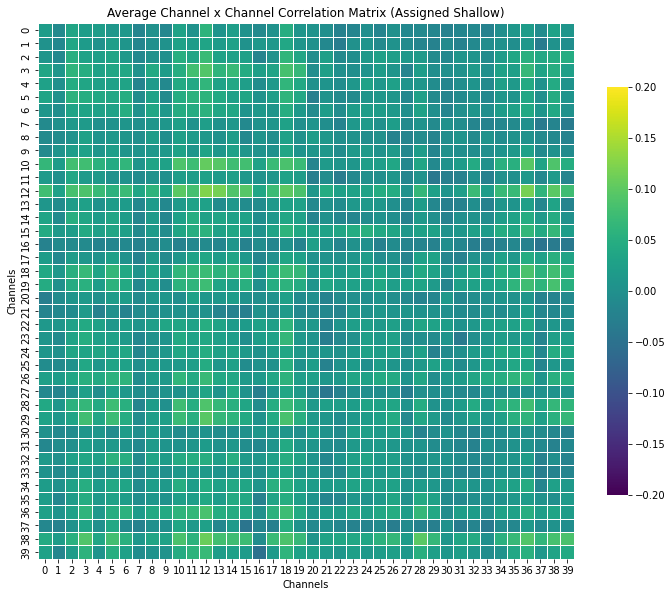

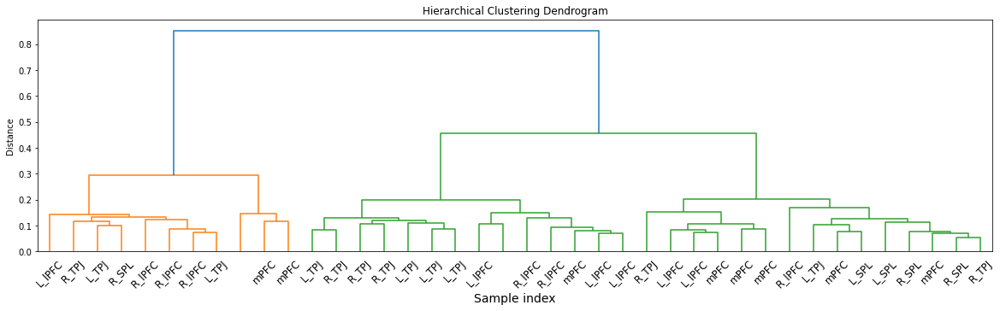

Hierarchical Clustering Labels: [5 5 4 1 4 4 4 6 6 5 2 5 2 5 4 1 7 4 1 1 6 6 3 3 3 3 1 6 1 1 6 6 3 6 3 3 1
 5 2 4]


/home/joyce/.local/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


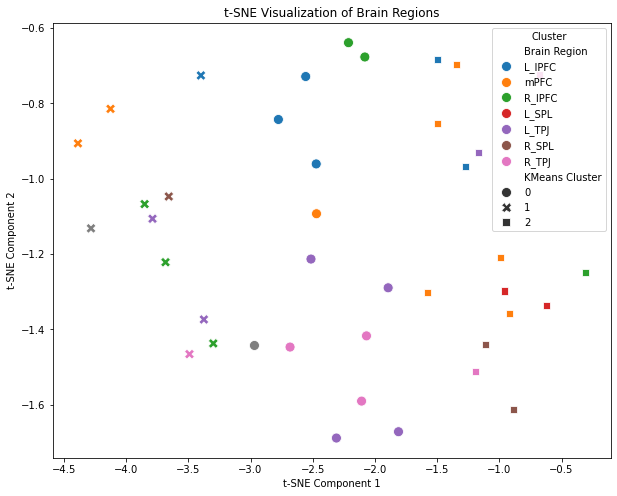

4040
4050
4060
4700
4720
6110
6120
6130
6140
6150
6160
6170
6190
6210
6220
6410
6420
6430
6440
6450
6460
6470
6480
6490
6710
6730
6760
6770
6790
6810
6820
6830
6840
6850


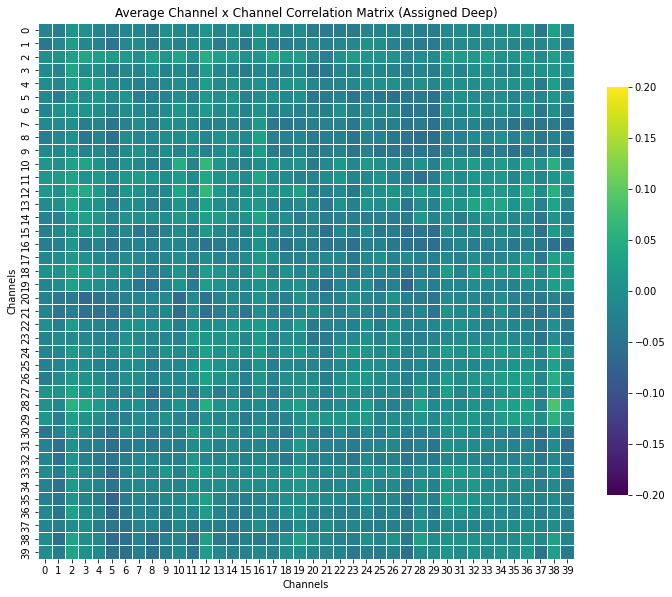

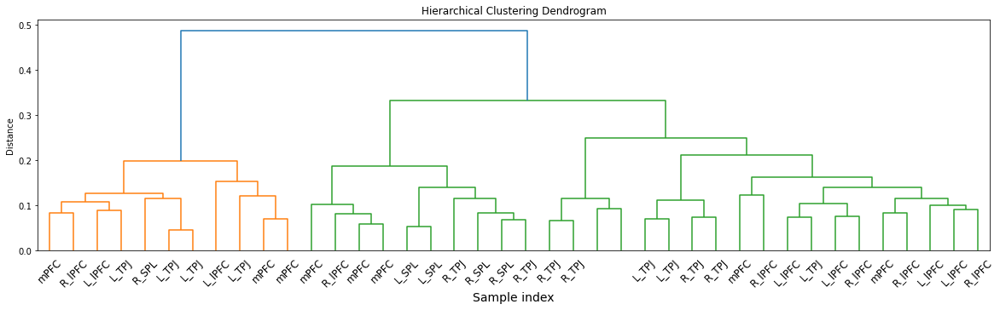

Hierarchical Clustering Labels: [7 7 2 7 1 7 7 3 3 3 2 7 2 1 7 7 3 7 1 7 4 4 6 6 1 7 1 1 2 1 4 4 4 6 6 5 5
 4 5 5]


/home/joyce/.local/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


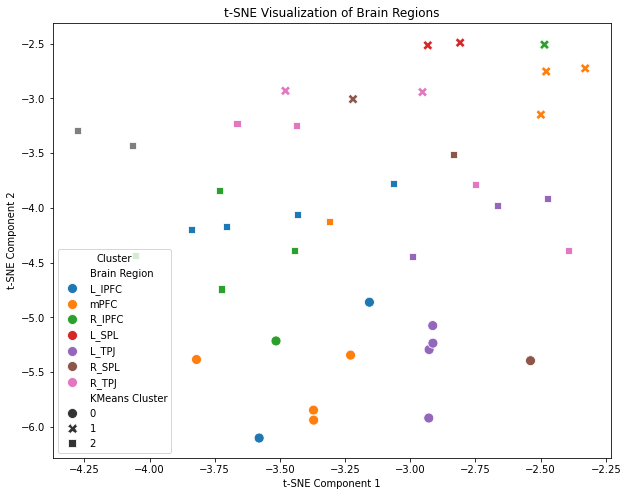

In [482]:
all_dyads_matrix = channel_channel_matrix(all_dyads, condition = 'All Subjects')

low_connection_matrix = channel_channel_matrix(low_connection, condition = 'Low Connection')
high_connection_matrix = channel_channel_matrix(high_connection, condition = 'High Connection')

low_depth_matrix = channel_channel_matrix(low_depth, condition = 'Low Depth')
high_depth_matrix = channel_channel_matrix(high_depth, condition = 'High Depth')

shallow_matrix = channel_channel_matrix(shallow, condition = 'Assigned Shallow')
deep_matrix = channel_channel_matrix(deep, condition = 'Assigned Deep')

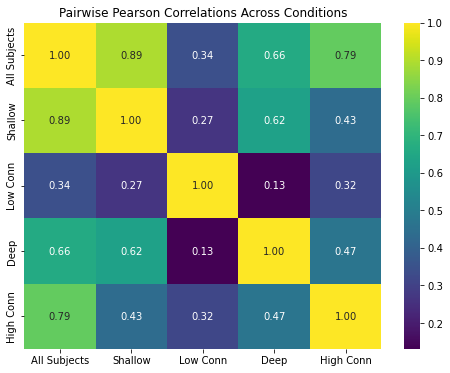

In [484]:
# List of matrices
matrices = [
    all_dyads_matrix,
    shallow_matrix,
    low_connection_matrix,
    high_connection_matrix,
    deep_matrix
#     low_depth_matrix,
#     high_depth_matrix,
    
]

# Compute upper triangular vectors including diagonal
upper_tri_vectors_with_diag = [upper_triangular_vector_with_diag(matrix) for matrix in matrices]

# Initialize a correlation matrix
num_matrices = len(upper_tri_vectors_with_diag)
correlation_matrix_diag = np.zeros((num_matrices, num_matrices))

# Compute pairwise Pearson correlations
for i in range(num_matrices):
    for j in range(num_matrices):
        corr, _ = pearsonr(upper_tri_vectors_with_diag[i], upper_tri_vectors_with_diag[j])
        correlation_matrix_diag[i, j] = corr

# Visualize the correlation matrix
plt.figure(figsize=(8, 6))
sns.heatmap(correlation_matrix_diag, annot=True, fmt=".2f", cmap='viridis',
            xticklabels=['All Subjects', 'Shallow','Low Conn','Deep', 'High Conn'],
            yticklabels=['All Subjects', 'Shallow','Low Conn', 'Deep', 'High Conn'])
plt.title('Pairwise Pearson Correlations Across Conditions')
plt.show()


## Timepoint-by-timepoint RDMs 

In [356]:
def downsample_by_average(df, window_size):
    """
    Downsample the columns of a DataFrame by averaging over a specified window size.
    """
    num_columns = df.shape[1]
    # Group columns in chunks of 'window_size' and compute the mean
    downsampled_df = pd.DataFrame(
        {f"group_{i}": df.iloc[:, i:i + window_size].mean(axis=1)
         for i in range(0, num_columns, window_size)}
    )
    return downsampled_df

def time_time_matrix(dyad_list, condition = 'Across Subjects'):
    correlation_matrices = []
    
    for dyad in dyad_list:
        s1 = sub1[sub1['Subject'] == dyad]
        s2 = sub2[sub2['Subject'] == dyad]

        channels_df1 = s1.filter(regex='^ch_').reset_index(drop = True)
        channels_df2 = s2.filter(regex='^ch_').reset_index(drop = True)
        
        window_size = 5
        #min_chunk = ['5min']*300+['10min']*300+['15min']*300+['20min']*321
        min_chunk = ['5min']*150+['10min']*150+['15min']*150+['20min']*161
        channels_df1_downsampled = downsample_by_average(channels_df1.T, window_size)
        channels_df2_downsampled = downsample_by_average(channels_df2.T, window_size)

        correlation_matrix1 = channels_df1_downsampled.corr(method='pearson')
        correlation_matrix2 = channels_df2_downsampled.corr(method='pearson')
        correlation_matrices.append(correlation_matrix1)
        correlation_matrices.append(correlation_matrix2)
        print(dyad)

    correlation_matrices = np.array(correlation_matrices)
    average_correlation_matrix = np.nanmean(correlation_matrices, axis=0)

    plt.figure(figsize=(48, 40))
    sns.heatmap(average_correlation_matrix, annot=False, cmap='coolwarm', square=True,
            linewidths=0.5, cbar_kws={"shrink": .75})

    plt.title('Average Time x Time Correlation Matrix ('+str(condition)+')')
    plt.xlabel('Time Points (per sec)')
    plt.ylabel('Time Points (per sec)')
    plt.savefig('plots/avg_time_matrix_'+str(condition)+'.png')
    plt.show()
    
    linked = linkage(average_correlation_matrix, method='ward')  
    # Plot the dendrogram
    plt.figure(figsize=(20, 5))
    dendrogram(linked, labels=channel_to_region_list)
    plt.title('Hierarchical Clustering Dendrogram')
    plt.xlabel('Sample index', fontsize=14) 
    plt.xticks(fontsize=12)
    plt.ylabel('Distance')
    plt.savefig('plots/avg_channel_cluster_'+str(condition)+'.png')
    plt.show()

    # To get cluster labels, cut the dendrogram at a chosen number of clusters
    num_clusters = 7
    clusters_hierarchical = fcluster(linked, num_clusters, criterion='maxclust')
    print("Hierarchical Clustering Labels:", clusters_hierarchical)
    
    
    tsne = TSNE(n_components=2, perplexity=30, random_state=42)  # Adjust perplexity as needed
    tsne_results = tsne.fit_transform(average_correlation_matrix)
    
    samples_per_chunk = 120

    min_chunk = (
    ['0-2min'] * samples_per_chunk +
    ['2-4min'] * samples_per_chunk +
    ['4-6min'] * samples_per_chunk +
    ['6-8min'] * samples_per_chunk +
    ['8-10min'] * samples_per_chunk +
    ['10-12min'] * samples_per_chunk +
    ['12-14min'] * samples_per_chunk +
    ['14-16min'] * samples_per_chunk +
    ['16-18min'] * samples_per_chunk +
    ['18-20+min'] * (samples_per_chunk+21)
    )
    time_chunk_order = [
    '0-2min', '2-4min', '4-6min', '6-8min', '8-10min',
    '10-12min', '12-14min', '14-16min', '16-18min', '18-20+min'
    ]
    color_palette = sns.color_palette("light:blue", n_colors=len(time_chunk_order))
    chunk_color_map = {chunk: color_palette[i] for i, chunk in enumerate(time_chunk_order)}

    tsne_df = pd.DataFrame({
    't-SNE-1': tsne_results[:, 0],
    't-SNE-2': tsne_results[:, 1],
    'Cluster': min_chunk
    }, index=correlation_matrix1.columns)  # Assuming channels_df1.columns are channel labels

    plt.figure(figsize=(12, 10))
    sns.scatterplot(
    x='t-SNE-1', y='t-SNE-2',
    hue='Cluster', palette=chunk_color_map,  # Use custom palette
    data=tsne_df, legend='full', s=100
)
    plt.title("t-SNE Visualization of Time Points")
    plt.xlabel("t-SNE Component 1")
    plt.ylabel("t-SNE Component 2")
    plt.legend(title="Cluster")
    plt.savefig('plots/avg_time_tsne_cluster_'+str(condition)+'.png')
    plt.show()

3020
3030
3120
3130
3170
3230
4040
4050
4060
4700
4720
5110
5120
5140
5150
5160
5170
5190
5210
5310
5410
5420
5430
5440
5450
5460
5470
5480
5490
5510
5710
5720
5730
5740
5760
5770
5780
5790
5830
5840
5850
6110
6120
6130
6140
6150
6160
6170
6190
6210
6220
6410
6420
6430
6440
6450
6460
6470
6480
6490
6710
6730
6760
6770
6790
6810
6820
6830
6840
6850


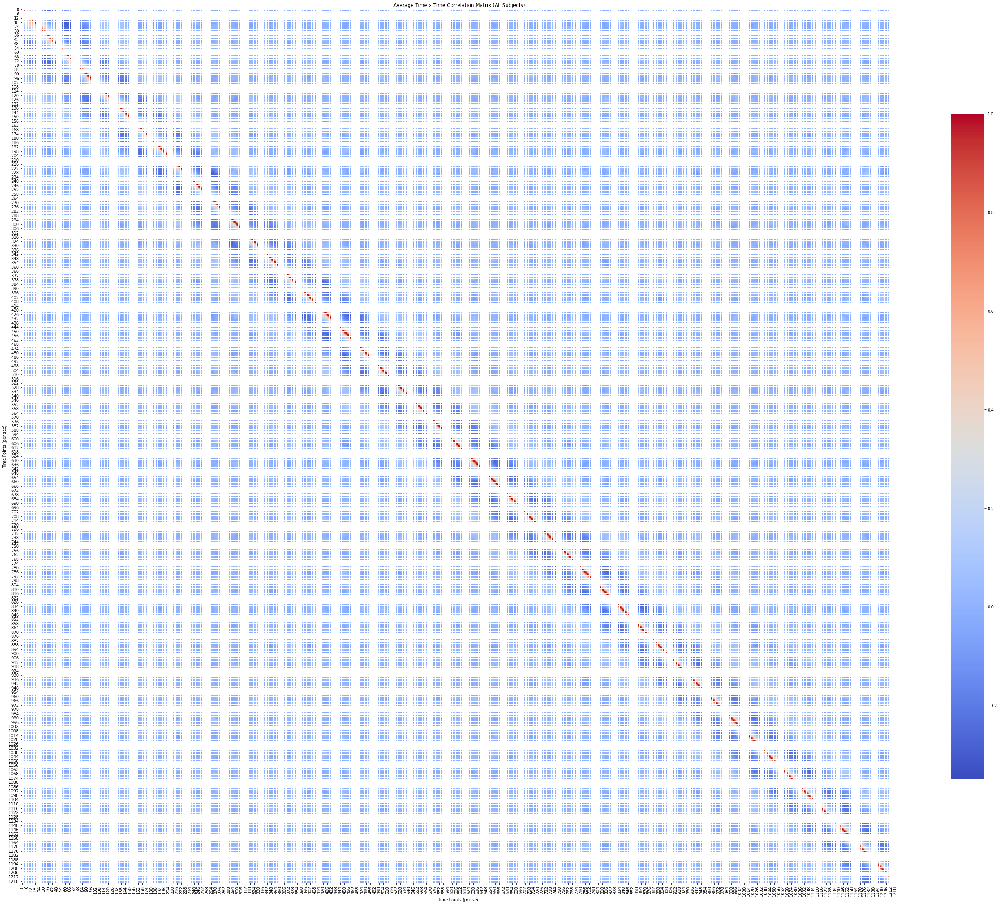

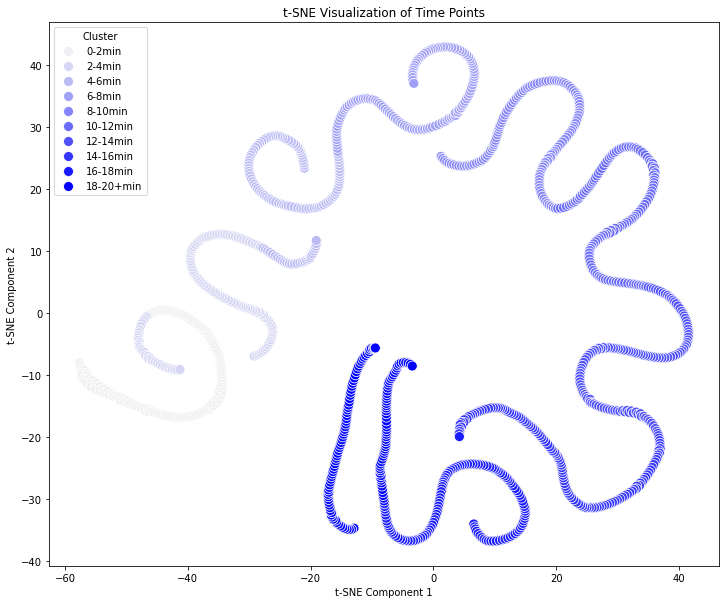

3020
3230
4720
5440
5450
5460
5730
5760
5780
6480
6830


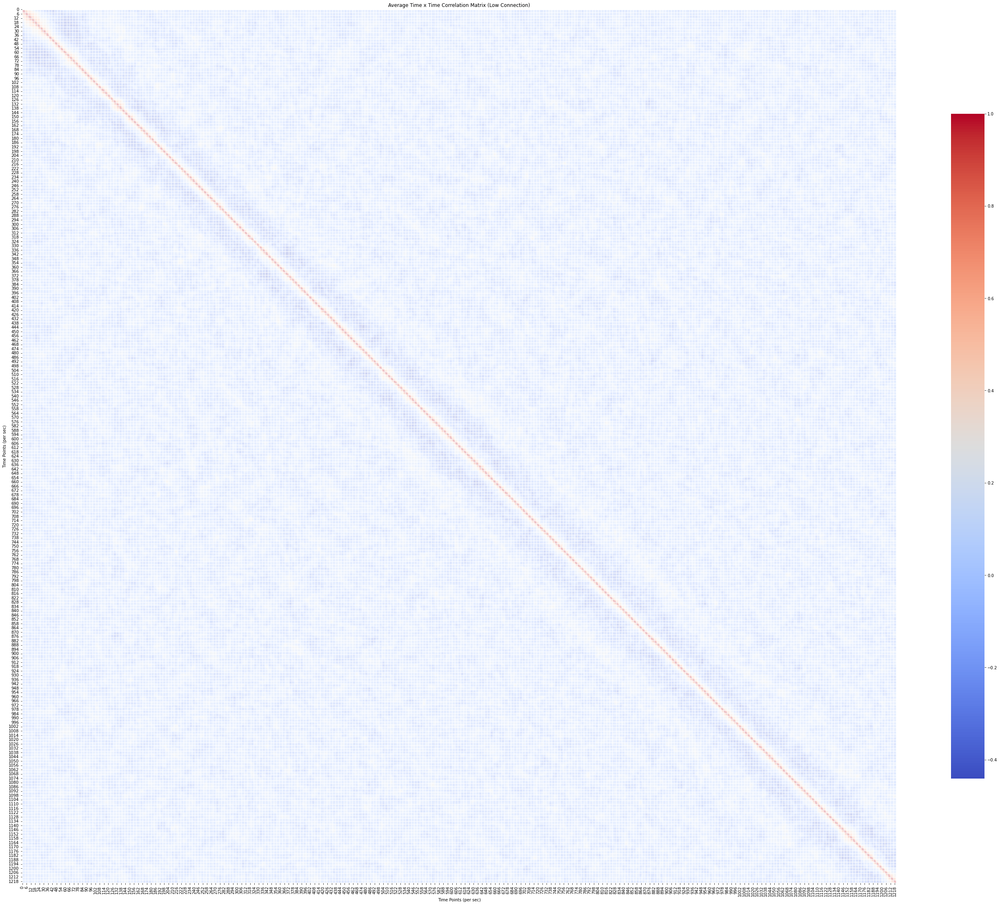

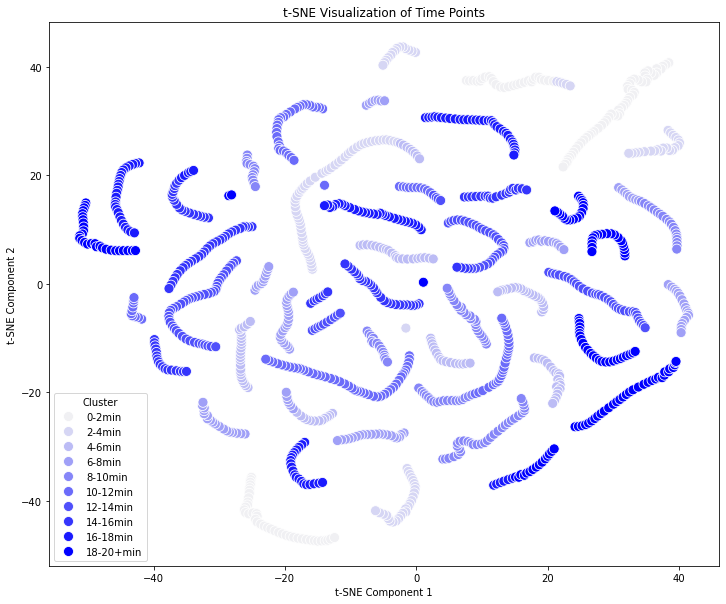

3030
3130
4060
5140
5210
5480
6160
6190
6440
6810
6820
6840


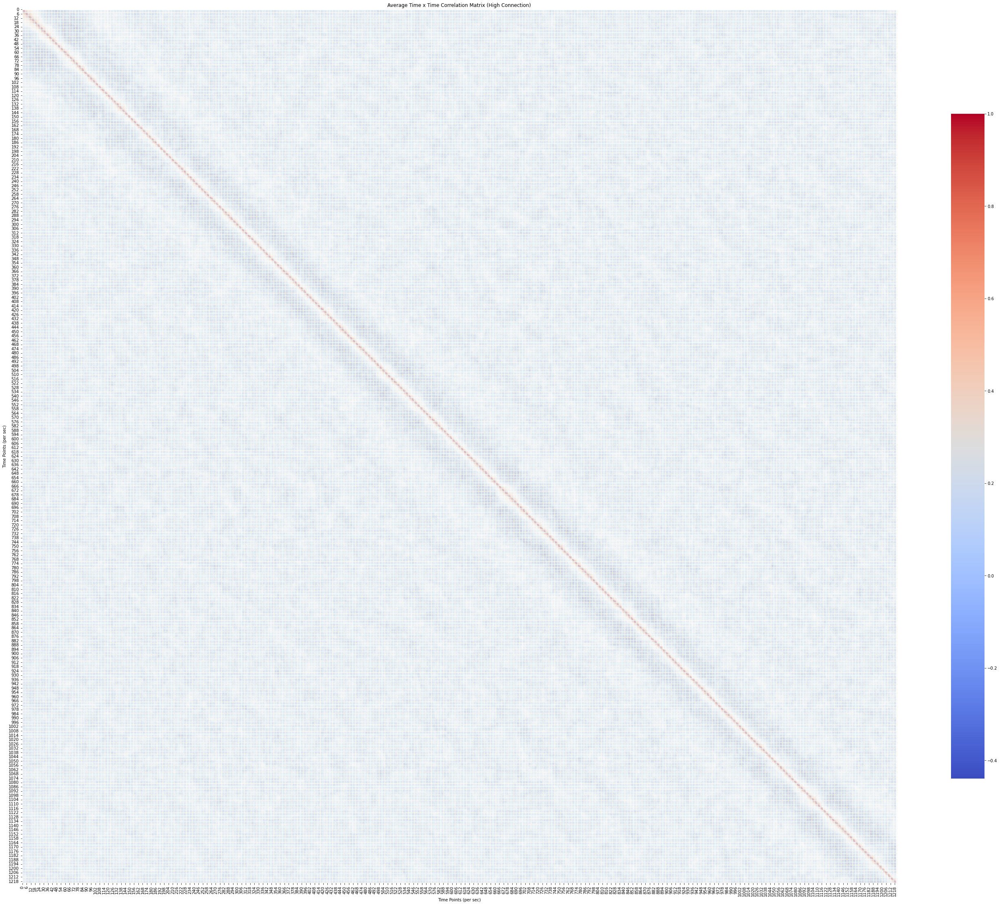

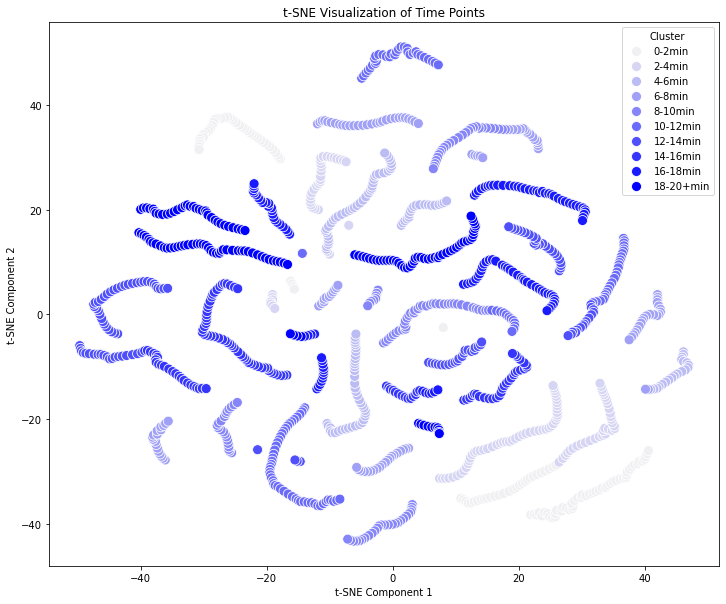

5150
5410
5430
5440
5450
5730
5780
5830
6760


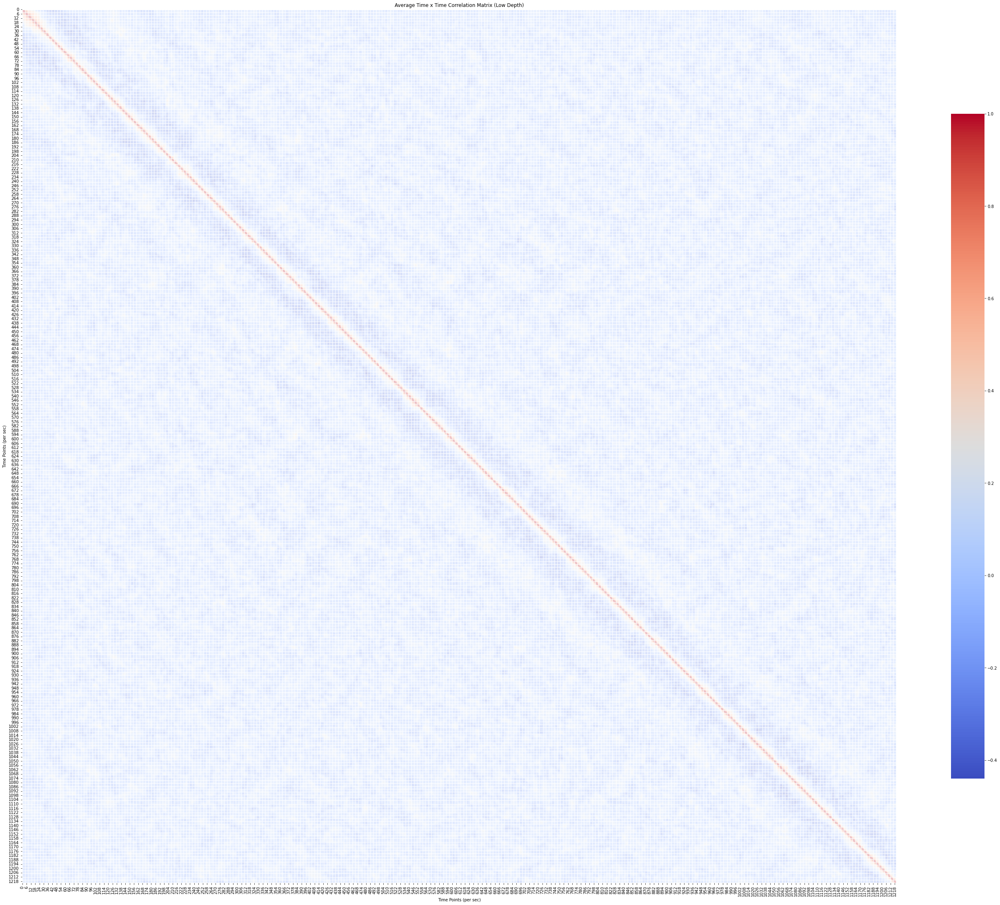

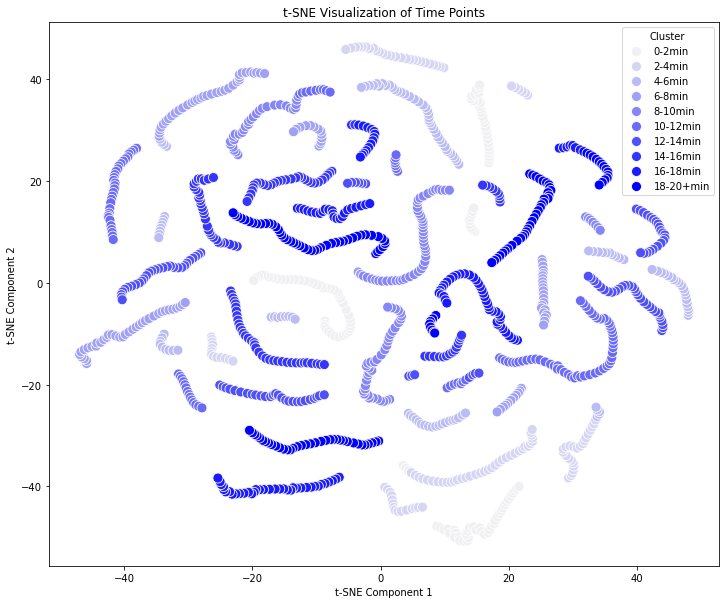

5140
5790
6110
6130
6160
6170
6190
6220
6410
6710
6730
6810
6840


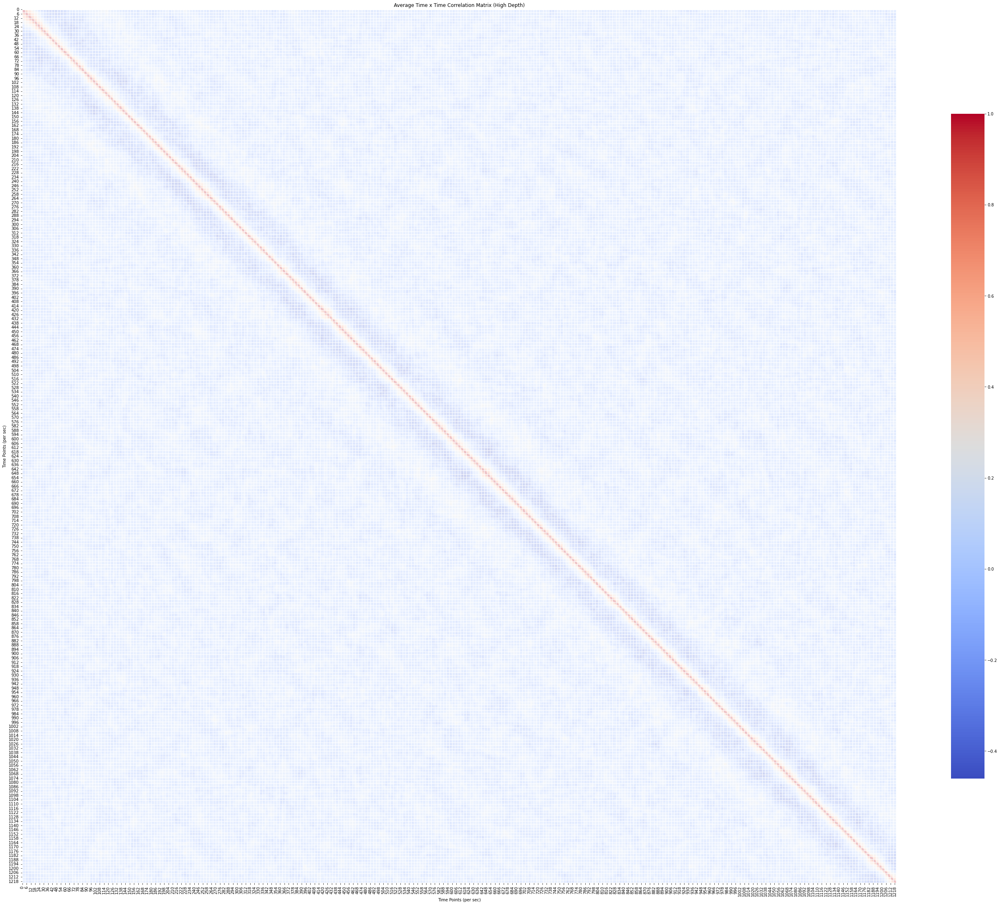

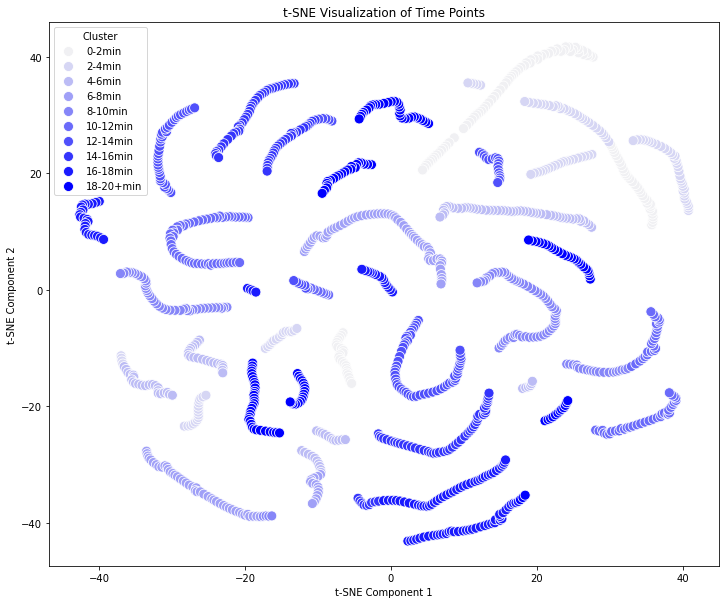

3020
3030
3120
3130
3170
3230
5110
5120
5140
5150
5160
5170
5190
5210
5310
5410
5420
5430
5440
5450
5460
5470
5480
5490
5510
5710
5720
5730
5740
5760
5770
5780
5790
5830
5840
5850


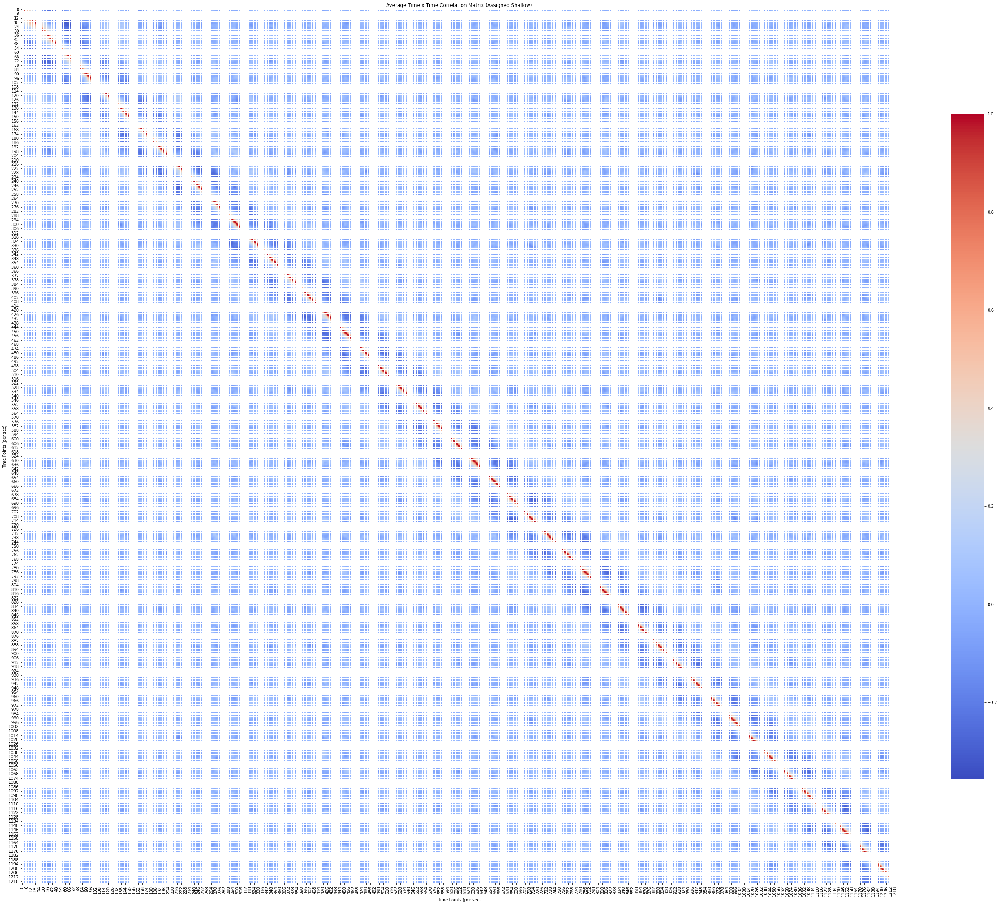

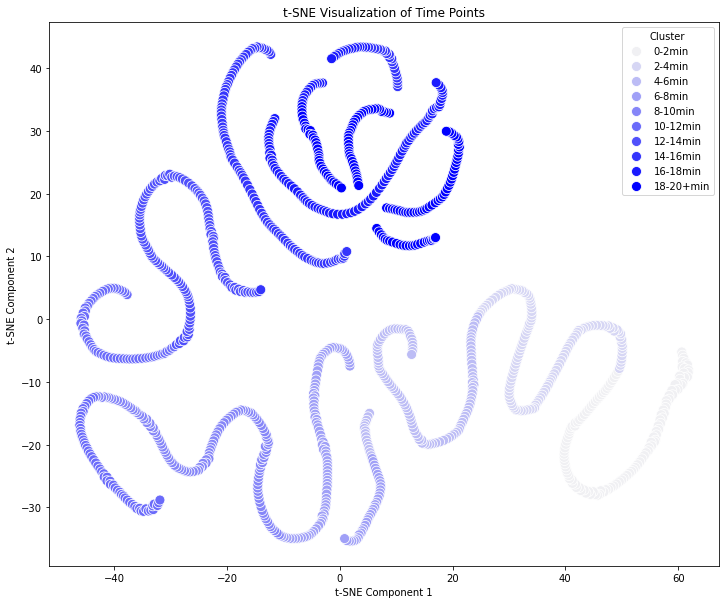

4040
4050
4060
4700
4720
6110
6120
6130
6140
6150
6160
6170
6190
6210
6220
6410
6420
6430
6440
6450
6460
6470
6480
6490
6710
6730
6760
6770
6790
6810
6820
6830
6840
6850


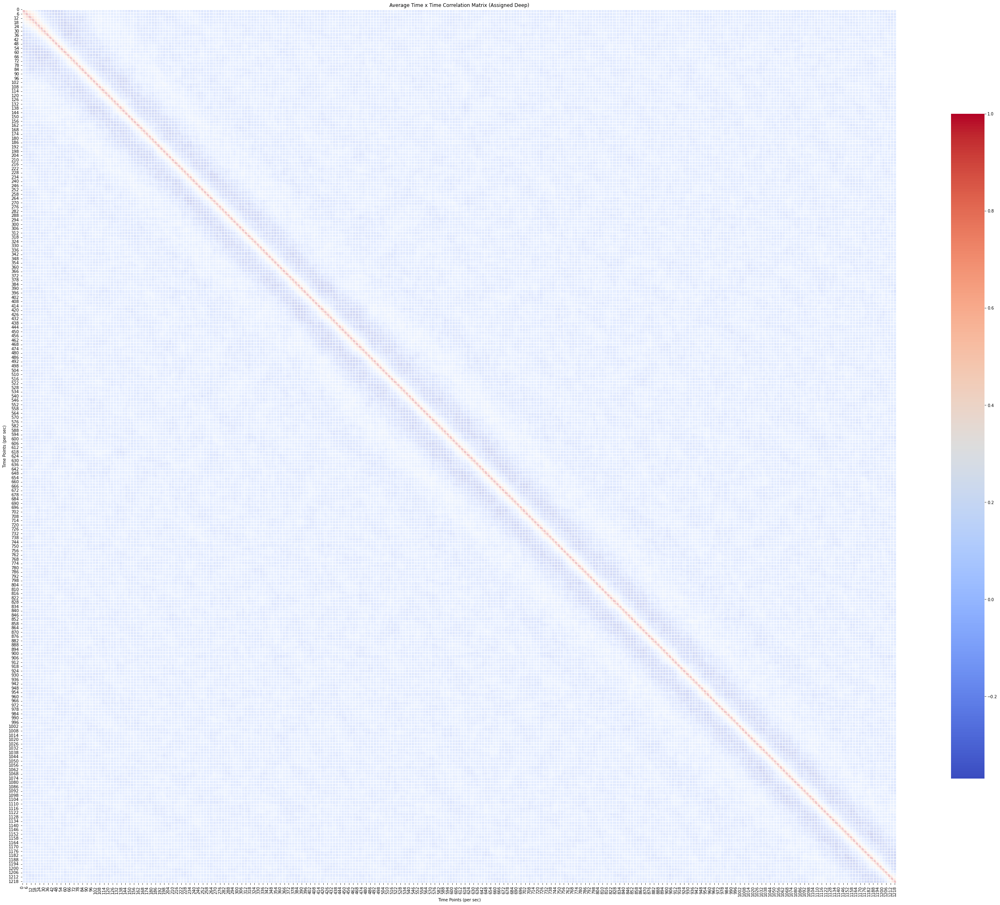

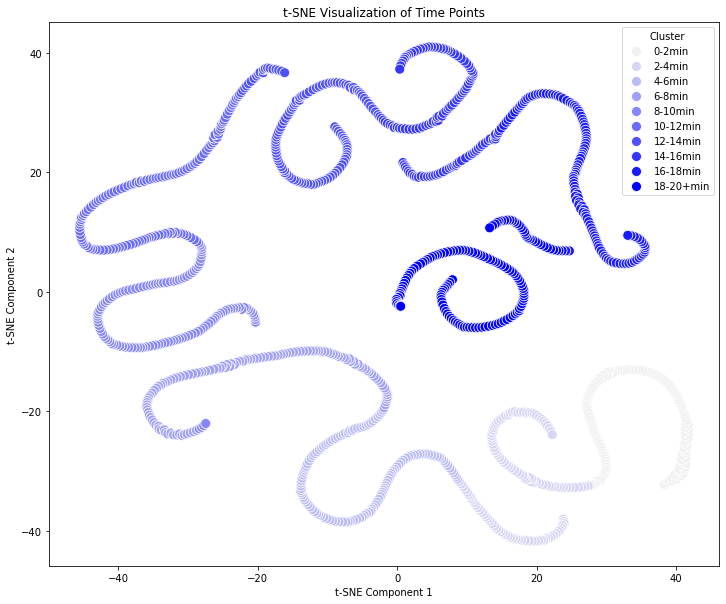

In [357]:
time_time_matrix(all_dyads, condition = 'All Subjects')

time_time_matrix(low_connection, condition = 'Low Connection')
time_time_matrix(high_connection, condition = 'High Connection')

time_time_matrix(low_depth, condition = 'Low Depth')
time_time_matrix(high_depth, condition = 'High Depth')

time_time_matrix(shallow, condition = 'Assigned Shallow')
time_time_matrix(deep, condition = 'Assigned Deep')

time_time_matrix(shallow, condition = 'Assigned Shallow (sampled)')
time_time_matrix(deep, condition = 'Assigned Deep (sampled)')

In [315]:
s1 = sub1[sub1['Subject'] == 3020]
s2 = sub2[sub2['Subject'] == 3020]

channels_df1 = s1.filter(regex='^ch_').reset_index(drop = True)
channels_df2 = s2.filter(regex='^ch_').reset_index(drop = True)

window_size = 5  # Averaging every 10 columns
channels_df1_downsampled = downsample_by_average(channels_df1.T, window_size)
channels_df2_downsampled = downsample_by_average(channels_df2.T, window_size)

correlation_matrix1 = channels_df1_downsampled.corr(method='pearson')
correlation_matrix2 = channels_df2_downsampled.corr(method='pearson')

6830


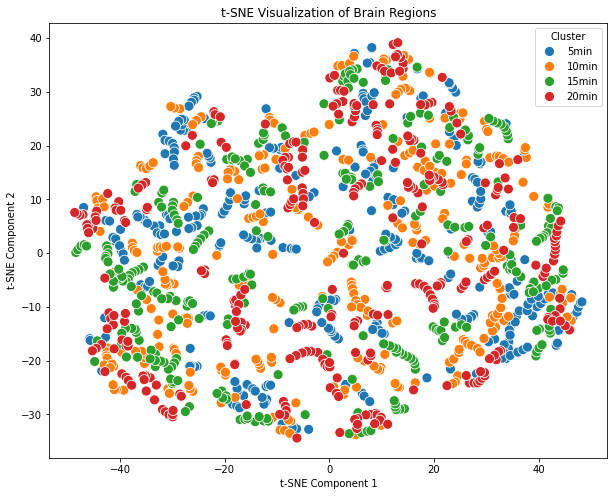

In [318]:
tsne = TSNE(n_components=2, perplexity=30, random_state=42)  # Adjust perplexity as needed
tsne_results = tsne.fit_transform(correlation_matrix2)

    # Create a DataFrame for plotting
tsne_df = pd.DataFrame({
't-SNE-1': tsne_results[:, 0],
't-SNE-2': tsne_results[:, 1],
'Cluster': ['5min']*300+['10min']*300+['15min']*300+['20min']*321
}, index=correlation_matrix1.columns)  # Assuming channels_df1.columns are channel labels

    # Plot t-SNE with cluster labels
plt.figure(figsize=(10, 8))
sns.scatterplot(
x='t-SNE-1', y='t-SNE-2',
hue='Cluster', palette='tab10',  # Customize palette as needed
data=tsne_df, legend='full',s=100 
    )
plt.title("t-SNE Visualization of Brain Regions")
plt.xlabel("t-SNE Component 1")
plt.ylabel("t-SNE Component 2")
plt.legend(title="Cluster")
#plt.savefig('plots/avg_channel_tsne_cluster_'+str(condition)+'.png')
plt.show()

## Dyad-by-dyad RDMs 

In [501]:
import pandas as pd
import numpy as np

def compute_upper_triangular_vector(subject_id, sub1, sub2):
    """
    Computes the upper triangular vector of the correlation matrix for a dyad (s1, s2).
    
    Parameters:
    - subject_id: int, the subject ID to filter on
    - sub1, sub2: DataFrames containing subject data with columns for channels
    
    Returns:
    - A 1D numpy array representing the upper triangular correlation values 
    """
    # Filter data for the specific subject
    s1 = sub1[sub1['Subject'] == subject_id]
    s2 = sub2[sub2['Subject'] == subject_id]


    # Select only the channel columns
    s1_channels = s1.filter(regex='^ch_').reset_index(drop = True)
    s2_channels = s2.filter(regex='^ch_').reset_index(drop = True)

    # Initialize the correlation matrix
    correlation_matrix = pd.DataFrame(index=s1_channels.columns, columns=s2_channels.columns)

    # Compute Pearson correlation for each channel pair, handling NaNs
    for ch1 in s1_channels.columns:
        for ch2 in s2_channels.columns:
            paired_data = pd.concat([s1_channels[ch1], s2_channels[ch2]], axis=1, keys=['s1', 's2']).dropna()
            
            # Compute correlation if there is sufficient data, otherwise set to 0
            if not paired_data.empty:
                correlation_matrix.loc[ch1, ch2] = paired_data['s1'].corr(paired_data['s2'])
            else:
                correlation_matrix.loc[ch1, ch2] = 0

    # Convert the correlation matrix to numeric type
    correlation_matrix = correlation_matrix.astype(float)
    
    upper_triangular_vector = correlation_matrix.where(np.triu(np.ones(correlation_matrix.shape), k=1).astype(bool)).stack()
    upper_triangular_vector = upper_triangular_vector.values
    
    # Extract and return the upper triangular values as a 1D vector
    return upper_triangular_vector


In [502]:
from scipy.spatial.distance import pdist, squareform
from scipy.spatial.distance import cosine

def compute_rdm(subject_ids, sub1, sub2):
    """
    Computes the Representational Dissimilarity Matrix (RDM) for a list of subjects.
    
    Parameters:
    - subject_ids: list of int, the subject IDs to compute the RDM for
    - sub1, sub2: DataFrames containing subject data with columns for channels
    
    Returns:
    - A DataFrame representing the RDM between each dyad (subject ID pair)
    """
    # Dictionary to store upper triangular vectors for each subject ID
    upper_triangular_vectors = {}

    for subject_id in subject_ids:
        print(subject_id)
        upper_triangular_vectors[subject_id] = compute_upper_triangular_vector(subject_id, sub1, sub2)

    upper_triangular_df = pd.DataFrame(upper_triangular_vectors)

    # Compute the RDM as 1 - Pearson correlation between the dyads
#     rdm = pd.DataFrame(
#         1 - squareform(pdist(upper_triangular_df.T, metric='correlation')),
#         index=subject_ids,
#         columns=subject_ids
#     )
    rdm = pd.DataFrame(
        1 - squareform(pdist(upper_triangular_df.T, metric='cosine')),
        index=subject_ids,
        columns=subject_ids
    )

    # The diagonal should be 0, as the distance between identical vectors is 0
    np.fill_diagonal(rdm.values, 0)

    return rdm


In [503]:
rating = pd.read_csv('CC_JNeuro_all.csv')
rating = rating[rating['Dyads'].isin(unique_subjects)]
condition = 'ConnectionComp_avg'
rating = rating.sort_values(by = [condition])
rating['Dyads'].unique()

array([5780, 5730, 5450, 4720, 6830, 3230, 5440, 3020, 6480, 5460, 5760,
       5850, 5490, 6760, 3120, 6470, 5190, 6220, 5830, 5740, 5420, 6110,
       4700, 5790, 5840, 6150, 6210, 6450, 6770, 6140, 3170, 5110, 5710,
       5160, 5430, 6790, 5120, 5770, 6460, 6430, 6420, 5720, 6730, 6710,
       5410, 6850, 5510, 6130, 5470, 6170, 5310, 6120, 6410, 4050, 5170,
       4040, 5150, 6490, 3030, 6840, 5140, 6160, 5480, 6440, 4060, 6820,
       5210, 3130, 6810, 6190])

5780
5730
5450
4720
6830
3230
5440
3020
6480
5460
5760
5850
5490
6760
3120
6470
5190
6220
5830
5740
5420
6110
4700
5790
5840
6150
6210
6450
6770
6140
3170
5110
5710
5160
5430
6790
5120
5770
6460
6430
6420
5720
6730
6710
5410
6850
5510
6130
5470
6170
5310
6120
6410
4050
5170
4040
5150
6490
3030
6840
5140
6160
5480
6440
4060
6820
5210
3130
6810
6190
          5780      5730      5450      4720      6830      3230      5440  \
5780  0.000000 -0.109033 -0.115127 -0.147728 -0.165248  0.071871  0.225503   
5730 -0.109033  0.000000 -0.014084  0.073419  0.005974  0.024825  0.021475   
5450 -0.115127 -0.014084  0.000000  0.199157  0.267939 -0.149425 -0.253062   
4720 -0.147728  0.073419  0.199157  0.000000  0.569470 -0.316269 -0.290048   
6830 -0.165248  0.005974  0.267939  0.569470  0.000000 -0.224847 -0.332065   
...        ...       ...       ...       ...       ...       ...       ...   
6820 -0.100185 -0.056132 -0.011338  0.176031  0.158465  0.063909 -0.041785   
5210 -0.038283 -0.092071 -

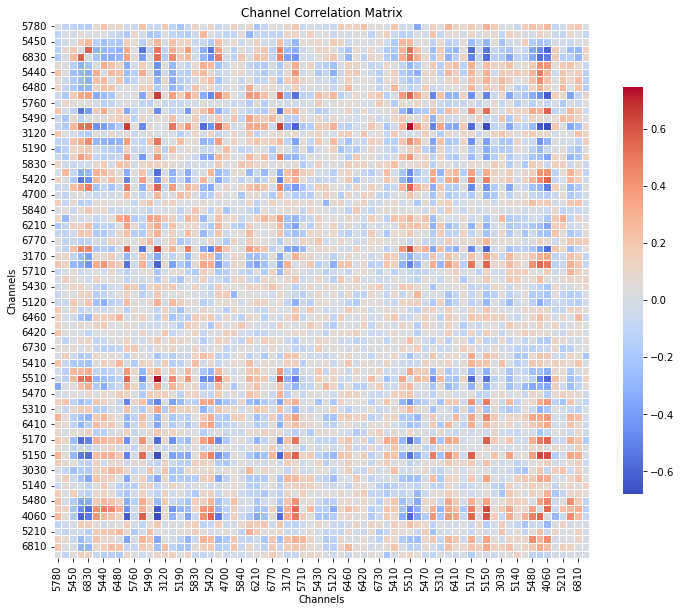

In [505]:
unique_subjects = sub1['Subject'].unique()
odd_ids = sorted([subject for subject in unique_subjects if int(str(subject)[0]) % 2 != 0])
even_ids = sorted([subject for subject in unique_subjects if int(str(subject)[0]) % 2 == 0])
rearranged_ids = odd_ids + even_ids

intersected_subjects = [dyad for dyad in rating['Dyads'].unique() if dyad in unique_subjects]
rdm = compute_rdm(intersected_subjects, sub1, sub2)

print(rdm)

plt.figure(figsize=(12, 10))
sns.heatmap(rdm, annot=False, cmap='coolwarm', square=True, 
            linewidths=0.5, cbar_kws={"shrink": .75})

plt.title('Channel Correlation Matrix')
plt.xlabel('Channels')
plt.ylabel('Channels')
plt.savefig('plots/sub_sub_RDM_'+str(condition)+'_channel_time.png')
plt.show()

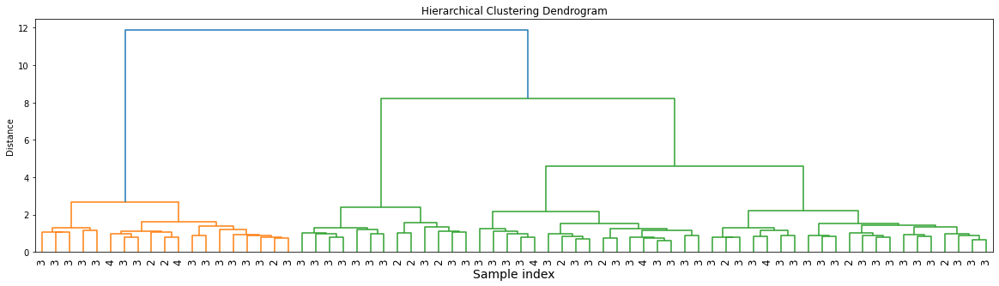

Hierarchical Clustering Labels: [3 3 3 2 2 1 1 1 3 2 3 1 3 2 3 2 3 2 3 1 1 2 3 3 3 3 2 2 3 2 1 1 3 3 3 3 3
 3 3 3 3 3 3 3 3 2 2 2 3 1 3 1 1 3 1 3 1 3 3 1 3 3 1 1 1 3 3 1 1 3]


In [506]:
from scipy.cluster.hierarchy import linkage, dendrogram, fcluster

# Perform hierarchical clustering on the RDM
linked = linkage(rdm, method='ward')  # Ward's method is a good default for preserving shapes

# Plot the dendrogram
plt.figure(figsize=(20, 5))
dendrogram(linked, labels=rating['ConnectionComp_avg'].astype(int).tolist())
plt.title('Hierarchical Clustering Dendrogram')
plt.xlabel('Sample index', fontsize=14) 
plt.xticks(fontsize=12)
plt.ylabel('Distance')
plt.show()

# To get cluster labels, cut the dendrogram at a chosen number of clusters
num_clusters = 3  
clusters_hierarchical = fcluster(linked, num_clusters, criterion='maxclust')
print("Hierarchical Clustering Labels:", clusters_hierarchical)
